In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=2 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.000e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 29539 
    Total predicted counts          : 29523.79
    Total off counts                : 101320.00

    Total background counts         : 20264.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 1min 8s, sys: 509 ms, total: 1min 9s
Wall time: 1min 21s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 29631 
    Total predicted counts          : 29672.79
    Total off counts                : 102065.00

    Total background counts         : 20413.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 29292 
    Total predicted counts          : 29715.59
    Total off counts                : 102279.00

    Total background counts         : 20

SpectrumDatasetOnOff

    Name                            : obs_12 

    Total counts                    : 29659 
    Total predicted counts          : 29604.79
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_13 

    Total counts                    : 29706 
    Total predicted counts          : 29588.59
    Total off counts                : 101644.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_25 

    Total counts                    : 29709 
    Total predicted counts          : 29657.39
    Total off counts                : 101988.00

    Total background counts         : 20397.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_26 

    Total counts                    : 29605 
    Total predicted counts          : 29548.39
    Total off counts                : 101443.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_38 

    Total counts                    : 29659 
    Total predicted counts          : 29493.99
    Total off counts                : 101171.00

    Total background counts         : 20234.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_39 

    Total counts                    : 29777 
    Total predicted counts          : 29647.59
    Total off counts                : 101939.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_50 

    Total counts                    : 29549 
    Total predicted counts          : 29685.99
    Total off counts                : 102131.00

    Total background counts         : 20426.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_51 

    Total counts                    : 29358 
    Total predicted counts          : 29599.99
    Total off counts                : 101701.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_64 

    Total counts                    : 29466 
    Total predicted counts          : 29533.99
    Total off counts                : 101371.00

    Total background counts         : 20274.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_65 

    Total counts                    : 29444 
    Total predicted counts          : 29560.19
    Total off counts                : 101502.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_81 

    Total counts                    : 29721 
    Total predicted counts          : 29569.99
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_82 

    Total counts                    : 29333 
    Total predicted counts          : 29590.39
    Total off counts                : 101653.00

    Total background counts         : 


SpectrumDatasetOnOff

    Name                            : obs_98 

    Total counts                    : 29633 
    Total predicted counts          : 29676.39
    Total off counts                : 102083.00

    Total background counts         : 20416.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_99 

    Total counts                    : 29775 
    Total predicted counts          : 29491.19
    Total off counts                : 101157.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_110 

    Total counts                    : 29562 
    Total predicted counts          : 29602.79
    Total off counts                : 101715.00

    Total background counts         : 20343.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_111 

    Total counts                    : 29781 
    Total predicted counts          : 29608.59
    Total off counts                : 101744.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_122 

    Total counts                    : 29344 
    Total predicted counts          : 29527.79
    Total off counts                : 101340.00

    Total background counts         : 20268.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_123 

    Total counts                    : 29507 
    Total predicted counts          : 29557.99
    Total off counts                : 101491.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_135 

    Total counts                    : 29708 
    Total predicted counts          : 29664.59
    Total off counts                : 102024.00

    Total background counts         : 20404.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_136 

    Total counts                    : 29460 
    Total predicted counts          : 29646.59
    Total off counts                : 101934.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_154 

    Total counts                    : 29547 
    Total predicted counts          : 29595.79
    Total off counts                : 101680.00

    Total background counts         : 20336.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_155 

    Total counts                    : 29576 
    Total predicted counts          : 29540.39
    Total off counts                : 101403.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_167 

    Total counts                    : 29402 
    Total predicted counts          : 29636.19
    Total off counts                : 101882.00

    Total background counts         : 20376.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_168 

    Total counts                    : 29475 
    Total predicted counts          : 29507.99
    Total off counts                : 101241.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_181 

    Total counts                    : 29460 
    Total predicted counts          : 29615.99
    Total off counts                : 101781.00

    Total background counts         : 20356.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_182 

    Total counts                    : 29392 
    Total predicted counts          : 29662.59
    Total off counts                : 102014.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_194 

    Total counts                    : 29600 
    Total predicted counts          : 29547.19
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_195 

    Total counts                    : 29433 
    Total predicted counts          : 29539.99
    Total off counts                : 101401.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_208 

    Total counts                    : 29307 
    Total predicted counts          : 29647.59
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_209 

    Total counts                    : 29464 
    Total predicted counts          : 29649.79
    Total off counts                : 101950.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_222 

    Total counts                    : 29611 
    Total predicted counts          : 29571.59
    Total off counts                : 101559.00

    Total background counts         : 20311.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_223 

    Total counts                    : 29655 
    Total predicted counts          : 29678.19
    Total off counts                : 102092.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_237 

    Total counts                    : 29437 
    Total predicted counts          : 29478.79
    Total off counts                : 101095.00

    Total background counts         : 20219.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_238 

    Total counts                    : 29676 
    Total predicted counts          : 29631.19
    Total off counts                : 101857.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_250 

    Total counts                    : 29884 
    Total predicted counts          : 29588.59
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_251 

    Total counts                    : 29717 
    Total predicted counts          : 29658.39
    Total off counts                : 101993.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_265 

    Total counts                    : 29514 
    Total predicted counts          : 29628.99
    Total off counts                : 101846.00

    Total background counts         : 20369.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_266 

    Total counts                    : 29314 
    Total predicted counts          : 29649.99
    Total off counts                : 101951.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_278 

    Total counts                    : 29761 
    Total predicted counts          : 29640.39
    Total off counts                : 101903.00

    Total background counts         : 20380.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_279 

    Total counts                    : 29778 
    Total predicted counts          : 29669.39
    Total off counts                : 102048.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_291 

    Total counts                    : 29433 
    Total predicted counts          : 29500.79
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_292 

    Total counts                    : 29746 
    Total predicted counts          : 29668.79
    Total off counts                : 102045.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_305 

    Total counts                    : 29690 
    Total predicted counts          : 29543.39
    Total off counts                : 101418.00

    Total background counts         : 20283.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_306 

    Total counts                    : 29519 
    Total predicted counts          : 29495.99
    Total off counts                : 101181.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_320 

    Total counts                    : 29926 
    Total predicted counts          : 29627.79
    Total off counts                : 101840.00

    Total background counts         : 20368.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_321 

    Total counts                    : 29637 
    Total predicted counts          : 29531.19
    Total off counts                : 101357.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_335 

    Total counts                    : 29680 
    Total predicted counts          : 29586.99
    Total off counts                : 101636.00

    Total background counts         : 20327.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_336 

    Total counts                    : 29667 
    Total predicted counts          : 29597.99
    Total off counts                : 101691.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_350 

    Total counts                    : 29728 
    Total predicted counts          : 29638.39
    Total off counts                : 101893.00

    Total background counts         : 20378.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_351 

    Total counts                    : 29688 
    Total predicted counts          : 29512.99
    Total off counts                : 101266.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_366 

    Total counts                    : 29521 
    Total predicted counts          : 29578.59
    Total off counts                : 101594.00

    Total background counts         : 20318.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_367 

    Total counts                    : 29499 
    Total predicted counts          : 29573.59
    Total off counts                : 101569.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_382 

    Total counts                    : 29525 
    Total predicted counts          : 29558.79
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_383 

    Total counts                    : 29626 
    Total predicted counts          : 29653.19
    Total off counts                : 101967.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_396 

    Total counts                    : 29402 
    Total predicted counts          : 29592.79
    Total off counts                : 101665.00

    Total background counts         : 20333.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_397 

    Total counts                    : 29675 
    Total predicted counts          : 29549.99
    Total off counts                : 101451.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_410 

    Total counts                    : 29710 
    Total predicted counts          : 29494.79
    Total off counts                : 101175.00

    Total background counts         : 20235.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_411 

    Total counts                    : 29869 
    Total predicted counts          : 29587.99
    Total off counts                : 101641.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_423 

    Total counts                    : 29629 
    Total predicted counts          : 29680.59
    Total off counts                : 102104.00

    Total background counts         : 20420.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_424 

    Total counts                    : 29438 
    Total predicted counts          : 29527.79
    Total off counts                : 101340.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_436 

    Total counts                    : 29446 
    Total predicted counts          : 29616.79
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_437 

    Total counts                    : 29321 
    Total predicted counts          : 29542.39
    Total off counts                : 101413.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_447 

    Total counts                    : 29448 
    Total predicted counts          : 29554.99
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_448 

    Total counts                    : 29785 
    Total predicted counts          : 29679.79
    Total off counts                : 102100.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_460 

    Total counts                    : 29642 
    Total predicted counts          : 29568.79
    Total off counts                : 101545.00

    Total background counts         : 20309.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_461 

    Total counts                    : 29265 
    Total predicted counts          : 29628.59
    Total off counts                : 101844.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_472 

    Total counts                    : 29500 
    Total predicted counts          : 29612.39
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_473 

    Total counts                    : 29482 
    Total predicted counts          : 29578.59
    Total off counts                : 101594.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_485 

    Total counts                    : 29562 
    Total predicted counts          : 29663.79
    Total off counts                : 102020.00

    Total background counts         : 20404.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_486 

    Total counts                    : 29545 
    Total predicted counts          : 29584.99
    Total off counts                : 101626.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_498 

    Total counts                    : 29498 
    Total predicted counts          : 29588.19
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_499 

    Total counts                    : 29732 
    Total predicted counts          : 29618.19
    Total off counts                : 101792.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_511 

    Total counts                    : 29570 
    Total predicted counts          : 29505.39
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_512 

    Total counts                    : 29307 
    Total predicted counts          : 29435.59
    Total off counts                : 100879.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_523 

    Total counts                    : 29149 
    Total predicted counts          : 29668.79
    Total off counts                : 102045.00

    Total background counts         : 20409.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_524 

    Total counts                    : 29636 
    Total predicted counts          : 29681.99
    Total off counts                : 102111.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_534 

    Total counts                    : 29830 
    Total predicted counts          : 29583.19
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_535 

    Total counts                    : 29589 
    Total predicted counts          : 29535.79
    Total off counts                : 101380.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_546 

    Total counts                    : 29372 
    Total predicted counts          : 29603.19
    Total off counts                : 101717.00

    Total background counts         : 20343.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_547 

    Total counts                    : 29636 
    Total predicted counts          : 29605.19
    Total off counts                : 101727.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_558 

    Total counts                    : 29767 
    Total predicted counts          : 29625.59
    Total off counts                : 101829.00

    Total background counts         : 20365.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_559 

    Total counts                    : 29524 
    Total predicted counts          : 29526.99
    Total off counts                : 101336.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_570 

    Total counts                    : 29516 
    Total predicted counts          : 29554.39
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_571 

    Total counts                    : 29504 
    Total predicted counts          : 29612.99
    Total off counts                : 101766.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_582 

    Total counts                    : 29373 
    Total predicted counts          : 29646.99
    Total off counts                : 101936.00

    Total background counts         : 20387.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_583 

    Total counts                    : 29468 
    Total predicted counts          : 29597.39
    Total off counts                : 101688.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_595 

    Total counts                    : 29661 
    Total predicted counts          : 29641.19
    Total off counts                : 101907.00

    Total background counts         : 20381.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_596 

    Total counts                    : 29374 
    Total predicted counts          : 29503.19
    Total off counts                : 101217.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_608 

    Total counts                    : 29572 
    Total predicted counts          : 29557.19
    Total off counts                : 101487.00

    Total background counts         : 20297.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_609 

    Total counts                    : 29474 
    Total predicted counts          : 29656.79
    Total off counts                : 101985.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_622 

    Total counts                    : 29678 
    Total predicted counts          : 29444.79
    Total off counts                : 100925.00

    Total background counts         : 20185.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_623 

    Total counts                    : 30030 
    Total predicted counts          : 29639.79
    Total off counts                : 101900.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_636 

    Total counts                    : 29677 
    Total predicted counts          : 29596.59
    Total off counts                : 101684.00

    Total background counts         : 20336.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_637 

    Total counts                    : 29487 
    Total predicted counts          : 29650.79
    Total off counts                : 101955.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_649 

    Total counts                    : 29691 
    Total predicted counts          : 29618.99
    Total off counts                : 101796.00

    Total background counts         : 20359.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_650 

    Total counts                    : 29514 
    Total predicted counts          : 29379.19
    Total off counts                : 100597.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_664 

    Total counts                    : 29498 
    Total predicted counts          : 29566.99
    Total off counts                : 101536.00

    Total background counts         : 20307.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_665 

    Total counts                    : 29394 
    Total predicted counts          : 29597.19
    Total off counts                : 101687.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_678 

    Total counts                    : 29475 
    Total predicted counts          : 29517.19
    Total off counts                : 101287.00

    Total background counts         : 20257.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_679 

    Total counts                    : 29468 
    Total predicted counts          : 29563.39
    Total off counts                : 101518.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_691 

    Total counts                    : 29515 
    Total predicted counts          : 29607.79
    Total off counts                : 101740.00

    Total background counts         : 20348.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_692 

    Total counts                    : 29780 
    Total predicted counts          : 29665.79
    Total off counts                : 102030.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_704 

    Total counts                    : 29530 
    Total predicted counts          : 29570.79
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_705 

    Total counts                    : 29527 
    Total predicted counts          : 29470.99
    Total off counts                : 101056.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_717 

    Total counts                    : 29448 
    Total predicted counts          : 29703.39
    Total off counts                : 102218.00

    Total background counts         : 20443.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_718 

    Total counts                    : 29635 
    Total predicted counts          : 29594.39
    Total off counts                : 101673.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_729 

    Total counts                    : 29642 
    Total predicted counts          : 29567.79
    Total off counts                : 101540.00

    Total background counts         : 20308.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_730 

    Total counts                    : 29550 
    Total predicted counts          : 29583.19
    Total off counts                : 101617.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_742 

    Total counts                    : 29542 
    Total predicted counts          : 29546.19
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_743 

    Total counts                    : 29649 
    Total predicted counts          : 29470.39
    Total off counts                : 101053.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_755 

    Total counts                    : 29621 
    Total predicted counts          : 29559.19
    Total off counts                : 101497.00

    Total background counts         : 20299.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_756 

    Total counts                    : 29482 
    Total predicted counts          : 29482.39
    Total off counts                : 101113.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_767 

    Total counts                    : 29240 
    Total predicted counts          : 29561.79
    Total off counts                : 101510.00

    Total background counts         : 20302.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_768 

    Total counts                    : 29461 
    Total predicted counts          : 29511.59
    Total off counts                : 101259.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_779 

    Total counts                    : 29590 
    Total predicted counts          : 29669.19
    Total off counts                : 102047.00

    Total background counts         : 20409.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_780 

    Total counts                    : 29821 
    Total predicted counts          : 29616.79
    Total off counts                : 101785.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_792 

    Total counts                    : 29661 
    Total predicted counts          : 29517.79
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_793 

    Total counts                    : 29568 
    Total predicted counts          : 29646.19
    Total off counts                : 101932.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_806 

    Total counts                    : 29680 
    Total predicted counts          : 29508.59
    Total off counts                : 101244.00

    Total background counts         : 20248.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_807 

    Total counts                    : 29521 
    Total predicted counts          : 29601.99
    Total off counts                : 101711.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_819 

    Total counts                    : 29583 
    Total predicted counts          : 29614.79
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_820 

    Total counts                    : 29397 
    Total predicted counts          : 29538.59
    Total off counts                : 101394.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_832 

    Total counts                    : 29424 
    Total predicted counts          : 29614.99
    Total off counts                : 101776.00

    Total background counts         : 20355.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_833 

    Total counts                    : 29591 
    Total predicted counts          : 29594.19
    Total off counts                : 101672.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_844 

    Total counts                    : 29381 
    Total predicted counts          : 29524.59
    Total off counts                : 101324.00

    Total background counts         : 20264.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_845 

    Total counts                    : 29661 
    Total predicted counts          : 29524.19
    Total off counts                : 101322.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_856 

    Total counts                    : 29882 
    Total predicted counts          : 29450.39
    Total off counts                : 100953.00

    Total background counts         : 20190.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_857 

    Total counts                    : 29467 
    Total predicted counts          : 29608.39
    Total off counts                : 101743.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_868 

    Total counts                    : 29347 
    Total predicted counts          : 29551.79
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_869 

    Total counts                    : 29520 
    Total predicted counts          : 29590.59
    Total off counts                : 101654.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_880 

    Total counts                    : 29188 
    Total predicted counts          : 29600.39
    Total off counts                : 101703.00

    Total background counts         : 20340.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_881 

    Total counts                    : 29394 
    Total predicted counts          : 29599.19
    Total off counts                : 101697.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_892 

    Total counts                    : 29691 
    Total predicted counts          : 29569.99
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_893 

    Total counts                    : 29466 
    Total predicted counts          : 29469.99
    Total off counts                : 101051.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_903 

    Total counts                    : 29222 
    Total predicted counts          : 29620.79
    Total off counts                : 101805.00

    Total background counts         : 20361.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_904 

    Total counts                    : 29332 
    Total predicted counts          : 29540.19
    Total off counts                : 101402.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_916 

    Total counts                    : 29733 
    Total predicted counts          : 29669.19
    Total off counts                : 102047.00

    Total background counts         : 20409.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_917 

    Total counts                    : 29458 
    Total predicted counts          : 29696.59
    Total off counts                : 102184.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_929 

    Total counts                    : 29623 
    Total predicted counts          : 29580.99
    Total off counts                : 101606.00

    Total background counts         : 20321.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_930 

    Total counts                    : 29640 
    Total predicted counts          : 29653.59
    Total off counts                : 101969.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_941 

    Total counts                    : 29644 
    Total predicted counts          : 29554.99
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_942 

    Total counts                    : 29238 
    Total predicted counts          : 29578.39
    Total off counts                : 101593.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_953 

    Total counts                    : 29499 
    Total predicted counts          : 29527.39
    Total off counts                : 101338.00

    Total background counts         : 20267.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_954 

    Total counts                    : 29608 
    Total predicted counts          : 29457.79
    Total off counts                : 100990.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_966 

    Total counts                    : 29705 
    Total predicted counts          : 29647.59
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_967 

    Total counts                    : 29377 
    Total predicted counts          : 29563.39
    Total off counts                : 101518.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_978 

    Total counts                    : 29364 
    Total predicted counts          : 29506.59
    Total off counts                : 101234.00

    Total background counts         : 20246.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_979 

    Total counts                    : 29611 
    Total predicted counts          : 29684.39
    Total off counts                : 102123.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_991 

    Total counts                    : 29716 
    Total predicted counts          : 29695.99
    Total off counts                : 102181.00

    Total background counts         : 20436.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_992 

    Total counts                    : 29589 
    Total predicted counts          : 29477.79
    Total off counts                : 101090.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_1004 

    Total counts                    : 29552 
    Total predicted counts          : 29560.99
    Total off counts                : 101506.00

    Total background counts         : 20301.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1005 

    Total counts                    : 29525 
    Total predicted counts          : 29610.79
    Total off counts                : 101755.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1015 

    Total counts                    : 29761 
    Total predicted counts          : 29577.39
    Total off counts                : 101588.00

    Total background counts         : 20317.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1016 

    Total counts                    : 29508 
    Total predicted counts          : 29648.39
    Total off counts                : 101943.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1027 

    Total counts                    : 29874 
    Total predicted counts          : 29543.19
    Total off counts                : 101417.00

    Total background counts         : 20283.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1028 

    Total counts                    : 29497 
    Total predicted counts          : 29675.19
    Total off counts                : 102077.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1038 

    Total counts                    : 29856 
    Total predicted counts          : 29558.19
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1039 

    Total counts                    : 29637 
    Total predicted counts          : 29543.59
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1050 

    Total counts                    : 29632 
    Total predicted counts          : 29611.99
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1051 

    Total counts                    : 29526 
    Total predicted counts          : 29701.39
    Total off counts                : 102208.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1061 

    Total counts                    : 29787 
    Total predicted counts          : 29378.19
    Total off counts                : 100592.00

    Total background counts         : 20118.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1062 

    Total counts                    : 29274 
    Total predicted counts          : 29587.59
    Total off counts                : 101639.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_1073 

    Total counts                    : 29444 
    Total predicted counts          : 29617.99
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1074 

    Total counts                    : 29548 
    Total predicted counts          : 29552.19
    Total off counts                : 101462.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1085 

    Total counts                    : 29880 
    Total predicted counts          : 29550.39
    Total off counts                : 101453.00

    Total background counts         : 20290.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1086 

    Total counts                    : 29708 
    Total predicted counts          : 29623.59
    Total off counts                : 101819.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1097 

    Total counts                    : 29603 
    Total predicted counts          : 29666.79
    Total off counts                : 102035.00

    Total background counts         : 20407.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1098 

    Total counts                    : 29339 
    Total predicted counts          : 29619.59
    Total off counts                : 101799.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1110 

    Total counts                    : 29553 
    Total predicted counts          : 29627.79
    Total off counts                : 101840.00

    Total background counts         : 20368.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1111 

    Total counts                    : 29520 
    Total predicted counts          : 29554.39
    Total off counts                : 101473.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1121 

    Total counts                    : 29518 
    Total predicted counts          : 29525.99
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1122 

    Total counts                    : 29800 
    Total predicted counts          : 29531.99
    Total off counts                : 101361.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1132 

    Total counts                    : 29707 
    Total predicted counts          : 29583.59
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1133 

    Total counts                    : 29517 
    Total predicted counts          : 29502.39
    Total off counts                : 101213.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1144 

    Total counts                    : 29587 
    Total predicted counts          : 29599.79
    Total off counts                : 101700.00

    Total background counts         : 20340.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1145 

    Total counts                    : 29740 
    Total predicted counts          : 29635.59
    Total off counts                : 101879.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1155 

    Total counts                    : 29417 
    Total predicted counts          : 29485.99
    Total off counts                : 101131.00

    Total background counts         : 20226.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1156 

    Total counts                    : 29689 
    Total predicted counts          : 29573.59
    Total off counts                : 101569.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1167 

    Total counts                    : 28994 
    Total predicted counts          : 29472.19
    Total off counts                : 101062.00

    Total background counts         : 20212.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1168 

    Total counts                    : 29741 
    Total predicted counts          : 29601.39
    Total off counts                : 101708.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1178 

    Total counts                    : 29531 
    Total predicted counts          : 29683.79
    Total off counts                : 102120.00

    Total background counts         : 20424.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1179 

    Total counts                    : 29767 
    Total predicted counts          : 29543.59
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1190 

    Total counts                    : 29932 
    Total predicted counts          : 29586.39
    Total off counts                : 101633.00

    Total background counts         : 20326.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1191 

    Total counts                    : 29672 
    Total predicted counts          : 29544.99
    Total off counts                : 101426.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1201 

    Total counts                    : 29391 
    Total predicted counts          : 29625.99
    Total off counts                : 101831.00

    Total background counts         : 20366.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1202 

    Total counts                    : 29495 
    Total predicted counts          : 29639.79
    Total off counts                : 101900.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1212 

    Total counts                    : 29363 
    Total predicted counts          : 29598.59
    Total off counts                : 101694.00

    Total background counts         : 20338.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1213 

    Total counts                    : 29581 
    Total predicted counts          : 29525.39
    Total off counts                : 101328.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1223 

    Total counts                    : 29588 
    Total predicted counts          : 29620.19
    Total off counts                : 101802.00

    Total background counts         : 20360.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1224 

    Total counts                    : 29811 
    Total predicted counts          : 29535.19
    Total off counts                : 101377.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1236 

    Total counts                    : 29439 
    Total predicted counts          : 29571.99
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1237 

    Total counts                    : 29404 
    Total predicted counts          : 29635.19
    Total off counts                : 101877.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1256 

    Total counts                    : 29513 
    Total predicted counts          : 29685.59
    Total off counts                : 102129.00

    Total background counts         : 20425.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1257 

    Total counts                    : 29683 
    Total predicted counts          : 29695.39
    Total off counts                : 102178.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1267 

    Total counts                    : 29683 
    Total predicted counts          : 29536.79
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1268 

    Total counts                    : 29263 
    Total predicted counts          : 29621.79
    Total off counts                : 101810.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1279 

    Total counts                    : 29478 
    Total predicted counts          : 29449.59
    Total off counts                : 100949.00

    Total background counts         : 20189.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1280 

    Total counts                    : 30036 
    Total predicted counts          : 29522.99
    Total off counts                : 101316.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1290 

    Total counts                    : 29429 
    Total predicted counts          : 29550.59
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1291 

    Total counts                    : 29648 
    Total predicted counts          : 29536.99
    Total off counts                : 101386.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1303 

    Total counts                    : 29857 
    Total predicted counts          : 29592.59
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1304 

    Total counts                    : 29760 
    Total predicted counts          : 29443.99
    Total off counts                : 100921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1325 

    Total counts                    : 29508 
    Total predicted counts          : 29504.99
    Total off counts                : 101226.00

    Total background counts         : 20245.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1326 

    Total counts                    : 29729 
    Total predicted counts          : 29434.99
    Total off counts                : 100876.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1337 

    Total counts                    : 29583 
    Total predicted counts          : 29525.99
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1338 

    Total counts                    : 29579 
    Total predicted counts          : 29508.79
    Total off counts                : 101245.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1349 

    Total counts                    : 29741 
    Total predicted counts          : 29655.19
    Total off counts                : 101977.00

    Total background counts         : 20395.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1350 

    Total counts                    : 29678 
    Total predicted counts          : 29626.39
    Total off counts                : 101833.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1361 

    Total counts                    : 29384 
    Total predicted counts          : 29547.99
    Total off counts                : 101441.00

    Total background counts         : 20288.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1362 

    Total counts                    : 29602 
    Total predicted counts          : 29697.19
    Total off counts                : 102187.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1372 

    Total counts                    : 29514 
    Total predicted counts          : 29601.79
    Total off counts                : 101710.00

    Total background counts         : 20342.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1373 

    Total counts                    : 29536 
    Total predicted counts          : 29684.99
    Total off counts                : 102126.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1383 

    Total counts                    : 29512 
    Total predicted counts          : 29528.79
    Total off counts                : 101345.00

    Total background counts         : 20269.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1384 

    Total counts                    : 29711 
    Total predicted counts          : 29446.19
    Total off counts                : 100932.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1394 

    Total counts                    : 29527 
    Total predicted counts          : 29511.79
    Total off counts                : 101260.00

    Total background counts         : 20252.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1395 

    Total counts                    : 29790 
    Total predicted counts          : 29599.99
    Total off counts                : 101701.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1406 

    Total counts                    : 29638 
    Total predicted counts          : 29551.99
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1407 

    Total counts                    : 29661 
    Total predicted counts          : 29639.99
    Total off counts                : 101901.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1418 

    Total counts                    : 29588 
    Total predicted counts          : 29585.79
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1419 

    Total counts                    : 29586 
    Total predicted counts          : 29583.79
    Total off counts                : 101620.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1430 

    Total counts                    : 29403 
    Total predicted counts          : 29561.19
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1431 

    Total counts                    : 29566 
    Total predicted counts          : 29585.99
    Total off counts                : 101631.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1442 

    Total counts                    : 29414 
    Total predicted counts          : 29421.59
    Total off counts                : 100809.00

    Total background counts         : 20161.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1443 

    Total counts                    : 29465 
    Total predicted counts          : 29431.99
    Total off counts                : 100861.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1455 

    Total counts                    : 29589 
    Total predicted counts          : 29498.19
    Total off counts                : 101192.00

    Total background counts         : 20238.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1456 

    Total counts                    : 29545 
    Total predicted counts          : 29682.19
    Total off counts                : 102112.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1467 

    Total counts                    : 29352 
    Total predicted counts          : 29523.59
    Total off counts                : 101319.00

    Total background counts         : 20263.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1468 

    Total counts                    : 29516 
    Total predicted counts          : 29679.59
    Total off counts                : 102099.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1480 

    Total counts                    : 29545 
    Total predicted counts          : 29458.39
    Total off counts                : 100993.00

    Total background counts         : 20198.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1481 

    Total counts                    : 29844 
    Total predicted counts          : 29667.39
    Total off counts                : 102038.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1497 

    Total counts                    : 29542 
    Total predicted counts          : 29492.39
    Total off counts                : 101163.00

    Total background counts         : 20232.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1498 

    Total counts                    : 29787 
    Total predicted counts          : 29561.99
    Total off counts                : 101511.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1512 

    Total counts                    : 29574 
    Total predicted counts          : 29492.99
    Total off counts                : 101166.00

    Total background counts         : 20233.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1513 

    Total counts                    : 29408 
    Total predicted counts          : 29636.99
    Total off counts                : 101886.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1526 

    Total counts                    : 29711 
    Total predicted counts          : 29596.79
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1527 

    Total counts                    : 29563 
    Total predicted counts          : 29528.59
    Total off counts                : 101344.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1539 

    Total counts                    : 29656 
    Total predicted counts          : 29504.79
    Total off counts                : 101225.00

    Total background counts         : 20245.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1540 

    Total counts                    : 29859 
    Total predicted counts          : 29523.19
    Total off counts                : 101317.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1554 

    Total counts                    : 29738 
    Total predicted counts          : 29625.59
    Total off counts                : 101829.00

    Total background counts         : 20365.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1555 

    Total counts                    : 29495 
    Total predicted counts          : 29570.19
    Total off counts                : 101552.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1568 

    Total counts                    : 29292 
    Total predicted counts          : 29665.79
    Total off counts                : 102030.00

    Total background counts         : 20406.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1569 

    Total counts                    : 29361 
    Total predicted counts          : 29581.99
    Total off counts                : 101611.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1584 

    Total counts                    : 29465 
    Total predicted counts          : 29553.39
    Total off counts                : 101468.00

    Total background counts         : 20293.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1585 

    Total counts                    : 29552 
    Total predicted counts          : 29599.19
    Total off counts                : 101697.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1600 

    Total counts                    : 29662 
    Total predicted counts          : 29536.99
    Total off counts                : 101386.00

    Total background counts         : 20277.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1601 

    Total counts                    : 29932 
    Total predicted counts          : 29494.39
    Total off counts                : 101173.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1615 

    Total counts                    : 29640 
    Total predicted counts          : 29636.59
    Total off counts                : 101884.00

    Total background counts         : 20376.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1616 

    Total counts                    : 29496 
    Total predicted counts          : 29543.39
    Total off counts                : 101418.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1630 

    Total counts                    : 29613 
    Total predicted counts          : 29568.99
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1631 

    Total counts                    : 29380 
    Total predicted counts          : 29556.59
    Total off counts                : 101484.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1645 

    Total counts                    : 29563 
    Total predicted counts          : 29574.59
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1646 

    Total counts                    : 29692 
    Total predicted counts          : 29550.39
    Total off counts                : 101453.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1661 

    Total counts                    : 29599 
    Total predicted counts          : 29693.39
    Total off counts                : 102168.00

    Total background counts         : 20433.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1662 

    Total counts                    : 29718 
    Total predicted counts          : 29543.39
    Total off counts                : 101418.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1677 

    Total counts                    : 29571 
    Total predicted counts          : 29527.99
    Total off counts                : 101341.00

    Total background counts         : 20268.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1678 

    Total counts                    : 29938 
    Total predicted counts          : 29603.59
    Total off counts                : 101719.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1692 

    Total counts                    : 29462 
    Total predicted counts          : 29607.39
    Total off counts                : 101738.00

    Total background counts         : 20347.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1693 

    Total counts                    : 29511 
    Total predicted counts          : 29532.99
    Total off counts                : 101366.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1708 

    Total counts                    : 29539 
    Total predicted counts          : 29540.39
    Total off counts                : 101403.00

    Total background counts         : 20280.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1709 

    Total counts                    : 29233 
    Total predicted counts          : 29525.39
    Total off counts                : 101328.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1723 

    Total counts                    : 29548 
    Total predicted counts          : 29561.19
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1724 

    Total counts                    : 29674 
    Total predicted counts          : 29603.39
    Total off counts                : 101718.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1737 

    Total counts                    : 29394 
    Total predicted counts          : 29538.39
    Total off counts                : 101393.00

    Total background counts         : 20278.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1738 

    Total counts                    : 29861 
    Total predicted counts          : 29500.79
    Total off counts                : 101205.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1751 

    Total counts                    : 29552 
    Total predicted counts          : 29500.79
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1752 

    Total counts                    : 29550 
    Total predicted counts          : 29532.19
    Total off counts                : 101362.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1766 

    Total counts                    : 29731 
    Total predicted counts          : 29672.19
    Total off counts                : 102062.00

    Total background counts         : 20412.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1767 

    Total counts                    : 29575 
    Total predicted counts          : 29534.79
    Total off counts                : 101375.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1780 

    Total counts                    : 29552 
    Total predicted counts          : 29487.39
    Total off counts                : 101138.00

    Total background counts         : 20227.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1781 

    Total counts                    : 29393 
    Total predicted counts          : 29532.79
    Total off counts                : 101365.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1795 

    Total counts                    : 29506 
    Total predicted counts          : 29447.59
    Total off counts                : 100939.00

    Total background counts         : 20187.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1796 

    Total counts                    : 29560 
    Total predicted counts          : 29674.59
    Total off counts                : 102074.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1809 

    Total counts                    : 29599 
    Total predicted counts          : 29573.59
    Total off counts                : 101569.00

    Total background counts         : 20313.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1810 

    Total counts                    : 29485 
    Total predicted counts          : 29507.19
    Total off counts                : 101237.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1824 

    Total counts                    : 29309 
    Total predicted counts          : 29614.59
    Total off counts                : 101774.00

    Total background counts         : 20354.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1825 

    Total counts                    : 29551 
    Total predicted counts          : 29757.19
    Total off counts                : 102487.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1838 

    Total counts                    : 29294 
    Total predicted counts          : 29568.59
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1839 

    Total counts                    : 29634 
    Total predicted counts          : 29477.39
    Total off counts                : 101088.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1853 

    Total counts                    : 29379 
    Total predicted counts          : 29508.39
    Total off counts                : 101243.00

    Total background counts         : 20248.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1854 

    Total counts                    : 29790 
    Total predicted counts          : 29612.59
    Total off counts                : 101764.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1867 

    Total counts                    : 29627 
    Total predicted counts          : 29479.39
    Total off counts                : 101098.00

    Total background counts         : 20219.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1868 

    Total counts                    : 29592 
    Total predicted counts          : 29580.19
    Total off counts                : 101602.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1882 

    Total counts                    : 29751 
    Total predicted counts          : 29632.99
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1883 

    Total counts                    : 29314 
    Total predicted counts          : 29586.59
    Total off counts                : 101634.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1895 

    Total counts                    : 29497 
    Total predicted counts          : 29593.99
    Total off counts                : 101671.00

    Total background counts         : 20334.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1896 

    Total counts                    : 29407 
    Total predicted counts          : 29555.59
    Total off counts                : 101479.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1909 

    Total counts                    : 29468 
    Total predicted counts          : 29584.59
    Total off counts                : 101624.00

    Total background counts         : 20324.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1910 

    Total counts                    : 29503 
    Total predicted counts          : 29628.79
    Total off counts                : 101845.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1924 

    Total counts                    : 29617 
    Total predicted counts          : 29390.79
    Total off counts                : 100655.00

    Total background counts         : 20131.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1925 

    Total counts                    : 29574 
    Total predicted counts          : 29571.99
    Total off counts                : 101561.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1939 

    Total counts                    : 29615 
    Total predicted counts          : 29673.79
    Total off counts                : 102070.00

    Total background counts         : 20414.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1940 

    Total counts                    : 29549 
    Total predicted counts          : 29597.59
    Total off counts                : 101689.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1953 

    Total counts                    : 29599 
    Total predicted counts          : 29652.59
    Total off counts                : 101964.00

    Total background counts         : 20392.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1954 

    Total counts                    : 29757 
    Total predicted counts          : 29643.39
    Total off counts                : 101918.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1970 

    Total counts                    : 29523 
    Total predicted counts          : 29626.19
    Total off counts                : 101832.00

    Total background counts         : 20366.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1971 

    Total counts                    : 29472 
    Total predicted counts          : 29549.19
    Total off counts                : 101447.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1987 

    Total counts                    : 29346 
    Total predicted counts          : 29470.99
    Total off counts                : 101056.00

    Total background counts         : 20211.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1988 

    Total counts                    : 29318 
    Total predicted counts          : 29600.39
    Total off counts                : 101703.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2001 

    Total counts                    : 29738 
    Total predicted counts          : 29393.79
    Total off counts                : 100670.00

    Total background counts         : 20134.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2002 

    Total counts                    : 29698 
    Total predicted counts          : 29526.59
    Total off counts                : 101334.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2015 

    Total counts                    : 29661 
    Total predicted counts          : 29650.79
    Total off counts                : 101955.00

    Total background counts         : 20391.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2016 

    Total counts                    : 29785 
    Total predicted counts          : 29578.59
    Total off counts                : 101594.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2031 

    Total counts                    : 29385 
    Total predicted counts          : 29478.19
    Total off counts                : 101092.00

    Total background counts         : 20218.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2032 

    Total counts                    : 29655 
    Total predicted counts          : 29389.39
    Total off counts                : 100648.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2046 

    Total counts                    : 29413 
    Total predicted counts          : 29521.79
    Total off counts                : 101310.00

    Total background counts         : 20262.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2047 

    Total counts                    : 29721 
    Total predicted counts          : 29533.79
    Total off counts                : 101370.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2061 

    Total counts                    : 29402 
    Total predicted counts          : 29637.19
    Total off counts                : 101887.00

    Total background counts         : 20377.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2062 

    Total counts                    : 29338 
    Total predicted counts          : 29546.19
    Total off counts                : 101432.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2077 

    Total counts                    : 29445 
    Total predicted counts          : 29614.79
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2078 

    Total counts                    : 29461 
    Total predicted counts          : 29614.99
    Total off counts                : 101776.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2090 

    Total counts                    : 29430 
    Total predicted counts          : 29620.39
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2091 

    Total counts                    : 29552 
    Total predicted counts          : 29563.19
    Total off counts                : 101517.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2105 

    Total counts                    : 29374 
    Total predicted counts          : 29658.79
    Total off counts                : 101995.00

    Total background counts         : 20399.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2106 

    Total counts                    : 29349 
    Total predicted counts          : 29568.19
    Total off counts                : 101542.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2118 

    Total counts                    : 29429 
    Total predicted counts          : 29553.79
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2119 

    Total counts                    : 29479 
    Total predicted counts          : 29588.39
    Total off counts                : 101643.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2131 

    Total counts                    : 29781 
    Total predicted counts          : 29539.79
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2132 

    Total counts                    : 29277 
    Total predicted counts          : 29653.59
    Total off counts                : 101969.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2145 

    Total counts                    : 29400 
    Total predicted counts          : 29524.39
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2146 

    Total counts                    : 29632 
    Total predicted counts          : 29560.39
    Total off counts                : 101503.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2157 

    Total counts                    : 29915 
    Total predicted counts          : 29599.39
    Total off counts                : 101698.00

    Total background counts         : 20339.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2158 

    Total counts                    : 29494 
    Total predicted counts          : 29567.19
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2171 

    Total counts                    : 29606 
    Total predicted counts          : 29565.59
    Total off counts                : 101529.00

    Total background counts         : 20305.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2172 

    Total counts                    : 29842 
    Total predicted counts          : 29534.19
    Total off counts                : 101372.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2186 

    Total counts                    : 29478 
    Total predicted counts          : 29606.19
    Total off counts                : 101732.00

    Total background counts         : 20346.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2187 

    Total counts                    : 29656 
    Total predicted counts          : 29621.39
    Total off counts                : 101808.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2201 

    Total counts                    : 29710 
    Total predicted counts          : 29555.79
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2202 

    Total counts                    : 29693 
    Total predicted counts          : 29545.39
    Total off counts                : 101428.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2214 

    Total counts                    : 29497 
    Total predicted counts          : 29490.79
    Total off counts                : 101155.00

    Total background counts         : 20231.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2215 

    Total counts                    : 29571 
    Total predicted counts          : 29683.99
    Total off counts                : 102121.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2228 

    Total counts                    : 29571 
    Total predicted counts          : 29553.59
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2229 

    Total counts                    : 29856 
    Total predicted counts          : 29659.99
    Total off counts                : 102001.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2241 

    Total counts                    : 29542 
    Total predicted counts          : 29589.39
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2242 

    Total counts                    : 29661 
    Total predicted counts          : 29579.39
    Total off counts                : 101598.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2254 

    Total counts                    : 29301 
    Total predicted counts          : 29622.19
    Total off counts                : 101812.00

    Total background counts         : 20362.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2255 

    Total counts                    : 29936 
    Total predicted counts          : 29536.19
    Total off counts                : 101382.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2267 

    Total counts                    : 29629 
    Total predicted counts          : 29569.39
    Total off counts                : 101548.00

    Total background counts         : 20309.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2268 

    Total counts                    : 29601 
    Total predicted counts          : 29623.99
    Total off counts                : 101821.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2280 

    Total counts                    : 29695 
    Total predicted counts          : 29493.59
    Total off counts                : 101169.00

    Total background counts         : 20233.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2281 

    Total counts                    : 29578 
    Total predicted counts          : 29608.99
    Total off counts                : 101746.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2291 

    Total counts                    : 29563 
    Total predicted counts          : 29414.39
    Total off counts                : 100773.00

    Total background counts         : 20154.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2292 

    Total counts                    : 29441 
    Total predicted counts          : 29519.99
    Total off counts                : 101301.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2303 

    Total counts                    : 29560 
    Total predicted counts          : 29473.39
    Total off counts                : 101068.00

    Total background counts         : 20213.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2304 

    Total counts                    : 29671 
    Total predicted counts          : 29628.79
    Total off counts                : 101845.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2317 

    Total counts                    : 29771 
    Total predicted counts          : 29461.39
    Total off counts                : 101008.00

    Total background counts         : 20201.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2318 

    Total counts                    : 29392 
    Total predicted counts          : 29602.99
    Total off counts                : 101716.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2332 

    Total counts                    : 29464 
    Total predicted counts          : 29650.39
    Total off counts                : 101953.00

    Total background counts         : 20390.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2333 

    Total counts                    : 29483 
    Total predicted counts          : 29505.99
    Total off counts                : 101231.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2346 

    Total counts                    : 29495 
    Total predicted counts          : 29522.79
    Total off counts                : 101315.00

    Total background counts         : 20263.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2347 

    Total counts                    : 29565 
    Total predicted counts          : 29483.39
    Total off counts                : 101118.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2360 

    Total counts                    : 29096 
    Total predicted counts          : 29471.19
    Total off counts                : 101057.00

    Total background counts         : 20211.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2361 

    Total counts                    : 29558 
    Total predicted counts          : 29598.39
    Total off counts                : 101693.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2373 

    Total counts                    : 29634 
    Total predicted counts          : 29533.99
    Total off counts                : 101371.00

    Total background counts         : 20274.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2374 

    Total counts                    : 29460 
    Total predicted counts          : 29505.99
    Total off counts                : 101231.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2388 

    Total counts                    : 29768 
    Total predicted counts          : 29648.99
    Total off counts                : 101946.00

    Total background counts         : 20389.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2389 

    Total counts                    : 29735 
    Total predicted counts          : 29481.59
    Total off counts                : 101109.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2401 

    Total counts                    : 29630 
    Total predicted counts          : 29698.99
    Total off counts                : 102196.00

    Total background counts         : 20439.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2402 

    Total counts                    : 29755 
    Total predicted counts          : 29551.39
    Total off counts                : 101458.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2414 

    Total counts                    : 29434 
    Total predicted counts          : 29656.99
    Total off counts                : 101986.00

    Total background counts         : 20397.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2415 

    Total counts                    : 29646 
    Total predicted counts          : 29429.19
    Total off counts                : 100847.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2430 

    Total counts                    : 29668 
    Total predicted counts          : 29605.39
    Total off counts                : 101728.00

    Total background counts         : 20345.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2431 

    Total counts                    : 29580 
    Total predicted counts          : 29480.39
    Total off counts                : 101103.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2445 

    Total counts                    : 29579 
    Total predicted counts          : 29640.59
    Total off counts                : 101904.00

    Total background counts         : 20380.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2446 

    Total counts                    : 29032 
    Total predicted counts          : 29595.39
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2461 

    Total counts                    : 29778 
    Total predicted counts          : 29583.59
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2462 

    Total counts                    : 29283 
    Total predicted counts          : 29596.79
    Total off counts                : 101685.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2477 

    Total counts                    : 29447 
    Total predicted counts          : 29672.39
    Total off counts                : 102063.00

    Total background counts         : 20412.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2478 

    Total counts                    : 29509 
    Total predicted counts          : 29512.79
    Total off counts                : 101265.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2490 

    Total counts                    : 29472 
    Total predicted counts          : 29645.79
    Total off counts                : 101930.00

    Total background counts         : 20386.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2491 

    Total counts                    : 29864 
    Total predicted counts          : 29588.79
    Total off counts                : 101645.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2504 

    Total counts                    : 29496 
    Total predicted counts          : 29576.19
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2505 

    Total counts                    : 29451 
    Total predicted counts          : 29574.59
    Total off counts                : 101574.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2516 

    Total counts                    : 29473 
    Total predicted counts          : 29525.59
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2517 

    Total counts                    : 29518 
    Total predicted counts          : 29653.59
    Total off counts                : 101969.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2530 

    Total counts                    : 29518 
    Total predicted counts          : 29539.39
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2531 

    Total counts                    : 29360 
    Total predicted counts          : 29567.39
    Total off counts                : 101538.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2543 

    Total counts                    : 29519 
    Total predicted counts          : 29669.39
    Total off counts                : 102048.00

    Total background counts         : 20409.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2544 

    Total counts                    : 29601 
    Total predicted counts          : 29585.79
    Total off counts                : 101630.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2555 

    Total counts                    : 29508 
    Total predicted counts          : 29482.79
    Total off counts                : 101115.00

    Total background counts         : 20223.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2556 

    Total counts                    : 29389 
    Total predicted counts          : 29556.79
    Total off counts                : 101485.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2570 

    Total counts                    : 29571 
    Total predicted counts          : 29516.99
    Total off counts                : 101286.00

    Total background counts         : 20257.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2571 

    Total counts                    : 29674 
    Total predicted counts          : 29564.79
    Total off counts                : 101525.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2583 

    Total counts                    : 29861 
    Total predicted counts          : 29509.99
    Total off counts                : 101251.00

    Total background counts         : 20250.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2584 

    Total counts                    : 29569 
    Total predicted counts          : 29602.39
    Total off counts                : 101713.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2597 

    Total counts                    : 29658 
    Total predicted counts          : 29579.59
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2598 

    Total counts                    : 29629 
    Total predicted counts          : 29561.39
    Total off counts                : 101508.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2611 

    Total counts                    : 29648 
    Total predicted counts          : 29564.99
    Total off counts                : 101526.00

    Total background counts         : 20305.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2612 

    Total counts                    : 29563 
    Total predicted counts          : 29509.19
    Total off counts                : 101247.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2624 

    Total counts                    : 29564 
    Total predicted counts          : 29535.79
    Total off counts                : 101380.00

    Total background counts         : 20276.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2625 

    Total counts                    : 29402 
    Total predicted counts          : 29613.59
    Total off counts                : 101769.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2637 

    Total counts                    : 29716 
    Total predicted counts          : 29548.19
    Total off counts                : 101442.00

    Total background counts         : 20288.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2638 

    Total counts                    : 29894 
    Total predicted counts          : 29678.59
    Total off counts                : 102094.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2650 

    Total counts                    : 29510 
    Total predicted counts          : 29497.19
    Total off counts                : 101187.00

    Total background counts         : 20237.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2651 

    Total counts                    : 29390 
    Total predicted counts          : 29643.99
    Total off counts                : 101921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2663 

    Total counts                    : 29334 
    Total predicted counts          : 29568.79
    Total off counts                : 101545.00

    Total background counts         : 20309.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2664 

    Total counts                    : 29861 
    Total predicted counts          : 29586.59
    Total off counts                : 101634.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2676 

    Total counts                    : 29286 
    Total predicted counts          : 29539.79
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2677 

    Total counts                    : 29441 
    Total predicted counts          : 29396.99
    Total off counts                : 100686.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2696 

    Total counts                    : 29646 
    Total predicted counts          : 29518.79
    Total off counts                : 101295.00

    Total background counts         : 20259.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2697 

    Total counts                    : 29679 
    Total predicted counts          : 29463.99
    Total off counts                : 101021.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2709 

    Total counts                    : 29643 
    Total predicted counts          : 29489.99
    Total off counts                : 101151.00

    Total background counts         : 20230.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2710 

    Total counts                    : 29712 
    Total predicted counts          : 29583.19
    Total off counts                : 101617.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2724 

    Total counts                    : 29685 
    Total predicted counts          : 29646.19
    Total off counts                : 101932.00

    Total background counts         : 20386.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2725 

    Total counts                    : 29402 
    Total predicted counts          : 29554.99
    Total off counts                : 101476.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2738 

    Total counts                    : 29710 
    Total predicted counts          : 29545.99
    Total off counts                : 101431.00

    Total background counts         : 20286.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2739 

    Total counts                    : 29539 
    Total predicted counts          : 29508.59
    Total off counts                : 101244.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2752 

    Total counts                    : 29790 
    Total predicted counts          : 29493.79
    Total off counts                : 101170.00

    Total background counts         : 20234.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2753 

    Total counts                    : 29807 
    Total predicted counts          : 29729.59
    Total off counts                : 102349.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2765 

    Total counts                    : 29430 
    Total predicted counts          : 29600.59
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2766 

    Total counts                    : 29846 
    Total predicted counts          : 29522.79
    Total off counts                : 101315.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2778 

    Total counts                    : 29540 
    Total predicted counts          : 29592.39
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2779 

    Total counts                    : 29445 
    Total predicted counts          : 29613.19
    Total off counts                : 101767.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2790 

    Total counts                    : 29544 
    Total predicted counts          : 29613.79
    Total off counts                : 101770.00

    Total background counts         : 20354.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2791 

    Total counts                    : 29607 
    Total predicted counts          : 29550.19
    Total off counts                : 101452.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2803 

    Total counts                    : 29632 
    Total predicted counts          : 29511.79
    Total off counts                : 101260.00

    Total background counts         : 20252.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2804 

    Total counts                    : 29694 
    Total predicted counts          : 29591.79
    Total off counts                : 101660.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2816 

    Total counts                    : 29613 
    Total predicted counts          : 29733.99
    Total off counts                : 102371.00

    Total background counts         : 20474.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2817 

    Total counts                    : 29967 
    Total predicted counts          : 29640.79
    Total off counts                : 101905.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2830 

    Total counts                    : 29523 
    Total predicted counts          : 29568.59
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2831 

    Total counts                    : 29819 
    Total predicted counts          : 29596.59
    Total off counts                : 101684.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2844 

    Total counts                    : 29495 
    Total predicted counts          : 29544.39
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2845 

    Total counts                    : 29584 
    Total predicted counts          : 29503.19
    Total off counts                : 101217.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2857 

    Total counts                    : 29453 
    Total predicted counts          : 29630.79
    Total off counts                : 101855.00

    Total background counts         : 20371.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2858 

    Total counts                    : 29280 
    Total predicted counts          : 29604.59
    Total off counts                : 101724.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2869 

    Total counts                    : 29552 
    Total predicted counts          : 29611.99
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2870 

    Total counts                    : 29561 
    Total predicted counts          : 29528.19
    Total off counts                : 101342.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2890 

    Total counts                    : 29169 
    Total predicted counts          : 29586.79
    Total off counts                : 101635.00

    Total background counts         : 20327.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2891 

    Total counts                    : 29459 
    Total predicted counts          : 29574.39
    Total off counts                : 101573.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2902 

    Total counts                    : 29838 
    Total predicted counts          : 29550.39
    Total off counts                : 101453.00

    Total background counts         : 20290.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2903 

    Total counts                    : 29714 
    Total predicted counts          : 29636.39
    Total off counts                : 101883.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2913 

    Total counts                    : 29577 
    Total predicted counts          : 29488.79
    Total off counts                : 101145.00

    Total background counts         : 20229.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2914 

    Total counts                    : 29577 
    Total predicted counts          : 29562.99
    Total off counts                : 101516.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2925 

    Total counts                    : 29582 
    Total predicted counts          : 29481.19
    Total off counts                : 101107.00

    Total background counts         : 20221.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2926 

    Total counts                    : 29558 
    Total predicted counts          : 29519.99
    Total off counts                : 101301.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2939 

    Total counts                    : 29812 
    Total predicted counts          : 29593.59
    Total off counts                : 101669.00

    Total background counts         : 20333.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2940 

    Total counts                    : 29541 
    Total predicted counts          : 29503.19
    Total off counts                : 101217.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2951 

    Total counts                    : 29638 
    Total predicted counts          : 29642.99
    Total off counts                : 101916.00

    Total background counts         : 20383.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2952 

    Total counts                    : 29621 
    Total predicted counts          : 29682.79
    Total off counts                : 102115.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2963 

    Total counts                    : 29459 
    Total predicted counts          : 29544.79
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2964 

    Total counts                    : 29778 
    Total predicted counts          : 29577.19
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2975 

    Total counts                    : 29725 
    Total predicted counts          : 29549.39
    Total off counts                : 101448.00

    Total background counts         : 20289.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2976 

    Total counts                    : 29566 
    Total predicted counts          : 29588.19
    Total off counts                : 101642.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2986 

    Total counts                    : 29677 
    Total predicted counts          : 29608.19
    Total off counts                : 101742.00

    Total background counts         : 20348.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2987 

    Total counts                    : 29827 
    Total predicted counts          : 29538.99
    Total off counts                : 101396.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2997 

    Total counts                    : 29848 
    Total predicted counts          : 29688.59
    Total off counts                : 102144.00

    Total background counts         : 20428.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2998 

    Total counts                    : 29716 
    Total predicted counts          : 29617.99
    Total off counts                : 101791.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3008 

    Total counts                    : 29558 
    Total predicted counts          : 29565.19
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3009 

    Total counts                    : 29675 
    Total predicted counts          : 29613.79
    Total off counts                : 101770.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3020 

    Total counts                    : 29418 
    Total predicted counts          : 29558.99
    Total off counts                : 101496.00

    Total background counts         : 20299.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3021 

    Total counts                    : 29549 
    Total predicted counts          : 29531.59
    Total off counts                : 101359.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3032 

    Total counts                    : 29588 
    Total predicted counts          : 29550.99
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3033 

    Total counts                    : 29516 
    Total predicted counts          : 29642.79
    Total off counts                : 101915.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3043 

    Total counts                    : 29614 
    Total predicted counts          : 29638.99
    Total off counts                : 101896.00

    Total background counts         : 20379.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3044 

    Total counts                    : 30122 
    Total predicted counts          : 29558.79
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3056 

    Total counts                    : 29660 
    Total predicted counts          : 29616.99
    Total off counts                : 101786.00

    Total background counts         : 20357.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3057 

    Total counts                    : 29400 
    Total predicted counts          : 29525.39
    Total off counts                : 101328.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3069 

    Total counts                    : 29476 
    Total predicted counts          : 29525.99
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3070 

    Total counts                    : 29593 
    Total predicted counts          : 29538.39
    Total off counts                : 101393.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3081 

    Total counts                    : 29491 
    Total predicted counts          : 29589.59
    Total off counts                : 101649.00

    Total background counts         : 20329.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3082 

    Total counts                    : 29569 
    Total predicted counts          : 29517.79
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3094 

    Total counts                    : 29538 
    Total predicted counts          : 29624.19
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3095 

    Total counts                    : 29706 
    Total predicted counts          : 29562.59
    Total off counts                : 101514.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3108 

    Total counts                    : 29608 
    Total predicted counts          : 29623.59
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3109 

    Total counts                    : 29426 
    Total predicted counts          : 29520.79
    Total off counts                : 101305.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3120 

    Total counts                    : 29733 
    Total predicted counts          : 29709.39
    Total off counts                : 102248.00

    Total background counts         : 20449.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3121 

    Total counts                    : 29658 
    Total predicted counts          : 29456.19
    Total off counts                : 100982.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3133 

    Total counts                    : 29654 
    Total predicted counts          : 29623.19
    Total off counts                : 101817.00

    Total background counts         : 20363.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3134 

    Total counts                    : 29784 
    Total predicted counts          : 29627.79
    Total off counts                : 101840.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3145 

    Total counts                    : 29278 
    Total predicted counts          : 29505.19
    Total off counts                : 101227.00

    Total background counts         : 20245.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3146 

    Total counts                    : 29361 
    Total predicted counts          : 29488.19
    Total off counts                : 101142.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3158 

    Total counts                    : 29704 
    Total predicted counts          : 29589.19
    Total off counts                : 101647.00

    Total background counts         : 20329.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3159 

    Total counts                    : 29367 
    Total predicted counts          : 29563.39
    Total off counts                : 101518.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3171 

    Total counts                    : 29684 
    Total predicted counts          : 29585.59
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3172 

    Total counts                    : 29387 
    Total predicted counts          : 29546.39
    Total off counts                : 101433.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3183 

    Total counts                    : 29288 
    Total predicted counts          : 29587.99
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3184 

    Total counts                    : 29662 
    Total predicted counts          : 29612.39
    Total off counts                : 101763.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3195 

    Total counts                    : 29599 
    Total predicted counts          : 29481.99
    Total off counts                : 101111.00

    Total background counts         : 20222.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3196 

    Total counts                    : 29361 
    Total predicted counts          : 29515.79
    Total off counts                : 101280.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3208 

    Total counts                    : 29439 
    Total predicted counts          : 29573.99
    Total off counts                : 101571.00

    Total background counts         : 20314.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3209 

    Total counts                    : 29322 
    Total predicted counts          : 29588.19
    Total off counts                : 101642.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3221 

    Total counts                    : 29746 
    Total predicted counts          : 29624.19
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3222 

    Total counts                    : 29641 
    Total predicted counts          : 29508.99
    Total off counts                : 101246.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3234 

    Total counts                    : 29057 
    Total predicted counts          : 29569.79
    Total off counts                : 101550.00

    Total background counts         : 20310.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3235 

    Total counts                    : 29325 
    Total predicted counts          : 29604.79
    Total off counts                : 101725.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3247 

    Total counts                    : 29505 
    Total predicted counts          : 29464.79
    Total off counts                : 101025.00

    Total background counts         : 20205.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3248 

    Total counts                    : 29622 
    Total predicted counts          : 29629.99
    Total off counts                : 101851.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3261 

    Total counts                    : 29906 
    Total predicted counts          : 29488.39
    Total off counts                : 101143.00

    Total background counts         : 20228.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3262 

    Total counts                    : 29705 
    Total predicted counts          : 29596.99
    Total off counts                : 101686.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3275 

    Total counts                    : 29854 
    Total predicted counts          : 29557.19
    Total off counts                : 101487.00

    Total background counts         : 20297.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3276 

    Total counts                    : 29450 
    Total predicted counts          : 29688.59
    Total off counts                : 102144.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3290 

    Total counts                    : 29758 
    Total predicted counts          : 29586.99
    Total off counts                : 101636.00

    Total background counts         : 20327.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3291 

    Total counts                    : 29916 
    Total predicted counts          : 29561.19
    Total off counts                : 101507.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3304 

    Total counts                    : 29564 
    Total predicted counts          : 29573.19
    Total off counts                : 101567.00

    Total background counts         : 20313.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3305 

    Total counts                    : 29670 
    Total predicted counts          : 29604.79
    Total off counts                : 101725.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3317 

    Total counts                    : 29604 
    Total predicted counts          : 29463.99
    Total off counts                : 101021.00

    Total background counts         : 20204.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3318 

    Total counts                    : 29479 
    Total predicted counts          : 29556.19
    Total off counts                : 101482.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3331 

    Total counts                    : 29678 
    Total predicted counts          : 29651.59
    Total off counts                : 101959.00

    Total background counts         : 20391.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3332 

    Total counts                    : 29551 
    Total predicted counts          : 29585.19
    Total off counts                : 101627.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3344 

    Total counts                    : 29378 
    Total predicted counts          : 29531.99
    Total off counts                : 101361.00

    Total background counts         : 20272.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3345 

    Total counts                    : 29311 
    Total predicted counts          : 29585.99
    Total off counts                : 101631.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3356 

    Total counts                    : 29651 
    Total predicted counts          : 29600.99
    Total off counts                : 101706.00

    Total background counts         : 20341.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3357 

    Total counts                    : 29636 
    Total predicted counts          : 29564.39
    Total off counts                : 101523.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3368 

    Total counts                    : 29501 
    Total predicted counts          : 29514.19
    Total off counts                : 101272.00

    Total background counts         : 20254.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3369 

    Total counts                    : 29784 
    Total predicted counts          : 29438.99
    Total off counts                : 100896.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3381 

    Total counts                    : 29501 
    Total predicted counts          : 29513.59
    Total off counts                : 101269.00

    Total background counts         : 20253.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3382 

    Total counts                    : 29473 
    Total predicted counts          : 29566.39
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3393 

    Total counts                    : 29475 
    Total predicted counts          : 29544.79
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3394 

    Total counts                    : 29588 
    Total predicted counts          : 29558.19
    Total off counts                : 101492.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3409 

    Total counts                    : 29549 
    Total predicted counts          : 29573.19
    Total off counts                : 101567.00

    Total background counts         : 20313.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3410 

    Total counts                    : 29900 
    Total predicted counts          : 29631.99
    Total off counts                : 101861.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3420 

    Total counts                    : 29679 
    Total predicted counts          : 29564.39
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3421 

    Total counts                    : 29579 
    Total predicted counts          : 29636.39
    Total off counts                : 101883.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3431 

    Total counts                    : 29414 
    Total predicted counts          : 29603.99
    Total off counts                : 101721.00

    Total background counts         : 20344.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3432 

    Total counts                    : 29569 
    Total predicted counts          : 29533.59
    Total off counts                : 101369.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3442 

    Total counts                    : 29474 
    Total predicted counts          : 29541.79
    Total off counts                : 101410.00

    Total background counts         : 20282.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3443 

    Total counts                    : 29453 
    Total predicted counts          : 29645.79
    Total off counts                : 101930.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3453 

    Total counts                    : 29335 
    Total predicted counts          : 29630.19
    Total off counts                : 101852.00

    Total background counts         : 20370.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3454 

    Total counts                    : 29892 
    Total predicted counts          : 29466.19
    Total off counts                : 101032.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3475 

    Total counts                    : 29731 
    Total predicted counts          : 29463.59
    Total off counts                : 101019.00

    Total background counts         : 20203.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3476 

    Total counts                    : 29701 
    Total predicted counts          : 29530.99
    Total off counts                : 101356.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3487 

    Total counts                    : 29491 
    Total predicted counts          : 29684.79
    Total off counts                : 102125.00

    Total background counts         : 20425.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3488 

    Total counts                    : 29419 
    Total predicted counts          : 29601.59
    Total off counts                : 101709.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3499 

    Total counts                    : 29609 
    Total predicted counts          : 29587.99
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3500 

    Total counts                    : 29328 
    Total predicted counts          : 29650.59
    Total off counts                : 101954.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3511 

    Total counts                    : 29459 
    Total predicted counts          : 29644.79
    Total off counts                : 101925.00

    Total background counts         : 20385.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3512 

    Total counts                    : 29487 
    Total predicted counts          : 29619.39
    Total off counts                : 101798.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3525 

    Total counts                    : 29550 
    Total predicted counts          : 29593.39
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3526 

    Total counts                    : 29621 
    Total predicted counts          : 29589.39
    Total off counts                : 101648.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3537 

    Total counts                    : 29866 
    Total predicted counts          : 29591.59
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3538 

    Total counts                    : 29272 
    Total predicted counts          : 29580.99
    Total off counts                : 101606.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3549 

    Total counts                    : 29962 
    Total predicted counts          : 29596.79
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3550 

    Total counts                    : 29755 
    Total predicted counts          : 29494.79
    Total off counts                : 101175.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3561 

    Total counts                    : 29163 
    Total predicted counts          : 29492.59
    Total off counts                : 101164.00

    Total background counts         : 20232.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3562 

    Total counts                    : 29501 
    Total predicted counts          : 29645.39
    Total off counts                : 101928.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3574 

    Total counts                    : 29726 
    Total predicted counts          : 29665.19
    Total off counts                : 102027.00

    Total background counts         : 20405.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3575 

    Total counts                    : 29597 
    Total predicted counts          : 29650.19
    Total off counts                : 101952.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3587 

    Total counts                    : 29586 
    Total predicted counts          : 29516.19
    Total off counts                : 101282.00

    Total background counts         : 20256.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3588 

    Total counts                    : 29261 
    Total predicted counts          : 29572.79
    Total off counts                : 101565.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3601 

    Total counts                    : 29678 
    Total predicted counts          : 29592.79
    Total off counts                : 101665.00

    Total background counts         : 20333.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3602 

    Total counts                    : 29478 
    Total predicted counts          : 29693.19
    Total off counts                : 102167.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3614 

    Total counts                    : 29669 
    Total predicted counts          : 29606.59
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3615 

    Total counts                    : 29666 
    Total predicted counts          : 29494.39
    Total off counts                : 101173.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3629 

    Total counts                    : 29641 
    Total predicted counts          : 29647.79
    Total off counts                : 101940.00

    Total background counts         : 20388.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3630 

    Total counts                    : 29469 
    Total predicted counts          : 29681.79
    Total off counts                : 102110.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3643 

    Total counts                    : 29563 
    Total predicted counts          : 29689.19
    Total off counts                : 102147.00

    Total background counts         : 20429.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3644 

    Total counts                    : 29637 
    Total predicted counts          : 29500.79
    Total off counts                : 101205.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3658 

    Total counts                    : 29387 
    Total predicted counts          : 29595.59
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3659 

    Total counts                    : 29442 
    Total predicted counts          : 29543.59
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3671 

    Total counts                    : 29408 
    Total predicted counts          : 29538.19
    Total off counts                : 101392.00

    Total background counts         : 20278.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3672 

    Total counts                    : 29452 
    Total predicted counts          : 29526.99
    Total off counts                : 101336.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3686 

    Total counts                    : 29574 
    Total predicted counts          : 29571.39
    Total off counts                : 101558.00

    Total background counts         : 20311.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3687 

    Total counts                    : 29630 
    Total predicted counts          : 29544.39
    Total off counts                : 101423.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3700 

    Total counts                    : 29724 
    Total predicted counts          : 29592.79
    Total off counts                : 101665.00

    Total background counts         : 20333.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3701 

    Total counts                    : 29646 
    Total predicted counts          : 29697.79
    Total off counts                : 102190.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3714 

    Total counts                    : 29747 
    Total predicted counts          : 29533.39
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3715 

    Total counts                    : 29674 
    Total predicted counts          : 29645.79
    Total off counts                : 101930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3728 

    Total counts                    : 29541 
    Total predicted counts          : 29612.99
    Total off counts                : 101766.00

    Total background counts         : 20353.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3729 

    Total counts                    : 29607 
    Total predicted counts          : 29523.59
    Total off counts                : 101319.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3742 

    Total counts                    : 29959 
    Total predicted counts          : 29506.39
    Total off counts                : 101233.00

    Total background counts         : 20246.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3743 

    Total counts                    : 29805 
    Total predicted counts          : 29504.19
    Total off counts                : 101222.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3758 

    Total counts                    : 29711 
    Total predicted counts          : 29562.59
    Total off counts                : 101514.00

    Total background counts         : 20302.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3759 

    Total counts                    : 29674 
    Total predicted counts          : 29660.39
    Total off counts                : 102003.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3774 

    Total counts                    : 29708 
    Total predicted counts          : 29495.19
    Total off counts                : 101177.00

    Total background counts         : 20235.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3775 

    Total counts                    : 29441 
    Total predicted counts          : 29634.39
    Total off counts                : 101873.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3788 

    Total counts                    : 29802 
    Total predicted counts          : 29513.59
    Total off counts                : 101269.00

    Total background counts         : 20253.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3789 

    Total counts                    : 29423 
    Total predicted counts          : 29536.79
    Total off counts                : 101385.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3802 

    Total counts                    : 29559 
    Total predicted counts          : 29623.59
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3803 

    Total counts                    : 29737 
    Total predicted counts          : 29527.39
    Total off counts                : 101338.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3816 

    Total counts                    : 29711 
    Total predicted counts          : 29568.59
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3817 

    Total counts                    : 29489 
    Total predicted counts          : 29604.59
    Total off counts                : 101724.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3831 

    Total counts                    : 29781 
    Total predicted counts          : 29508.19
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3832 

    Total counts                    : 29458 
    Total predicted counts          : 29609.59
    Total off counts                : 101749.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3846 

    Total counts                    : 29665 
    Total predicted counts          : 29607.99
    Total off counts                : 101741.00

    Total background counts         : 20348.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3847 

    Total counts                    : 29594 
    Total predicted counts          : 29563.99
    Total off counts                : 101521.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3861 

    Total counts                    : 29588 
    Total predicted counts          : 29609.79
    Total off counts                : 101750.00

    Total background counts         : 20350.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3862 

    Total counts                    : 29623 
    Total predicted counts          : 29519.39
    Total off counts                : 101298.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3876 

    Total counts                    : 29548 
    Total predicted counts          : 29596.79
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3877 

    Total counts                    : 29695 
    Total predicted counts          : 29488.99
    Total off counts                : 101146.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3892 

    Total counts                    : 29472 
    Total predicted counts          : 29597.79
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3893 

    Total counts                    : 29313 
    Total predicted counts          : 29569.59
    Total off counts                : 101549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3907 

    Total counts                    : 29621 
    Total predicted counts          : 29555.19
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3908 

    Total counts                    : 29260 
    Total predicted counts          : 29621.39
    Total off counts                : 101808.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3922 

    Total counts                    : 29914 
    Total predicted counts          : 29574.19
    Total off counts                : 101572.00

    Total background counts         : 20314.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3923 

    Total counts                    : 29499 
    Total predicted counts          : 29610.59
    Total off counts                : 101754.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3938 

    Total counts                    : 29456 
    Total predicted counts          : 29746.99
    Total off counts                : 102436.00

    Total background counts         : 20487.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3939 

    Total counts                    : 29610 
    Total predicted counts          : 29614.99
    Total off counts                : 101776.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3952 

    Total counts                    : 29934 
    Total predicted counts          : 29569.79
    Total off counts                : 101550.00

    Total background counts         : 20310.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3953 

    Total counts                    : 29645 
    Total predicted counts          : 29559.79
    Total off counts                : 101500.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3966 

    Total counts                    : 29662 
    Total predicted counts          : 29544.19
    Total off counts                : 101422.00

    Total background counts         : 20284.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3967 

    Total counts                    : 29547 
    Total predicted counts          : 29495.39
    Total off counts                : 101178.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3982 

    Total counts                    : 29776 
    Total predicted counts          : 29530.39
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3983 

    Total counts                    : 29637 
    Total predicted counts          : 29555.79
    Total off counts                : 101480.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3996 

    Total counts                    : 29592 
    Total predicted counts          : 29603.19
    Total off counts                : 101717.00

    Total background counts         : 20343.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3997 

    Total counts                    : 29816 
    Total predicted counts          : 29771.99
    Total off counts                : 102561.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4011 

    Total counts                    : 29491 
    Total predicted counts          : 29557.79
    Total off counts                : 101490.00

    Total background counts         : 20298.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4012 

    Total counts                    : 29555 
    Total predicted counts          : 29519.79
    Total off counts                : 101300.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4026 

    Total counts                    : 29465 
    Total predicted counts          : 29596.39
    Total off counts                : 101683.00

    Total background counts         : 20336.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4027 

    Total counts                    : 29551 
    Total predicted counts          : 29557.39
    Total off counts                : 101488.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4041 

    Total counts                    : 29549 
    Total predicted counts          : 29570.39
    Total off counts                : 101553.00

    Total background counts         : 20310.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4042 

    Total counts                    : 29779 
    Total predicted counts          : 29488.79
    Total off counts                : 101145.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4056 

    Total counts                    : 29745 
    Total predicted counts          : 29623.19
    Total off counts                : 101817.00

    Total background counts         : 20363.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4057 

    Total counts                    : 29447 
    Total predicted counts          : 29467.99
    Total off counts                : 101041.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4072 

    Total counts                    : 29481 
    Total predicted counts          : 29578.39
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4073 

    Total counts                    : 29524 
    Total predicted counts          : 29477.79
    Total off counts                : 101090.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4086 

    Total counts                    : 29594 
    Total predicted counts          : 29632.79
    Total off counts                : 101865.00

    Total background counts         : 20373.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4087 

    Total counts                    : 29383 
    Total predicted counts          : 29527.39
    Total off counts                : 101338.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4101 

    Total counts                    : 29513 
    Total predicted counts          : 29555.39
    Total off counts                : 101478.00

    Total background counts         : 20295.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4102 

    Total counts                    : 29759 
    Total predicted counts          : 29509.19
    Total off counts                : 101247.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4116 

    Total counts                    : 29765 
    Total predicted counts          : 29616.79
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4117 

    Total counts                    : 29262 
    Total predicted counts          : 29600.19
    Total off counts                : 101702.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4130 

    Total counts                    : 29734 
    Total predicted counts          : 29518.99
    Total off counts                : 101296.00

    Total background counts         : 20259.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4131 

    Total counts                    : 29224 
    Total predicted counts          : 29582.39
    Total off counts                : 101613.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4142 

    Total counts                    : 29723 
    Total predicted counts          : 29524.39
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4143 

    Total counts                    : 29731 
    Total predicted counts          : 29610.99
    Total off counts                : 101756.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4155 

    Total counts                    : 29626 
    Total predicted counts          : 29573.39
    Total off counts                : 101568.00

    Total background counts         : 20313.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4156 

    Total counts                    : 29694 
    Total predicted counts          : 29579.99
    Total off counts                : 101601.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4169 

    Total counts                    : 29430 
    Total predicted counts          : 29641.99
    Total off counts                : 101911.00

    Total background counts         : 20382.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4170 

    Total counts                    : 29335 
    Total predicted counts          : 29466.99
    Total off counts                : 101036.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4183 

    Total counts                    : 29777 
    Total predicted counts          : 29444.39
    Total off counts                : 100923.00

    Total background counts         : 20184.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4184 

    Total counts                    : 29658 
    Total predicted counts          : 29608.19
    Total off counts                : 101742.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4197 

    Total counts                    : 29647 
    Total predicted counts          : 29618.19
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4198 

    Total counts                    : 29774 
    Total predicted counts          : 29539.99
    Total off counts                : 101401.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4211 

    Total counts                    : 29641 
    Total predicted counts          : 29580.39
    Total off counts                : 101603.00

    Total background counts         : 20320.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4212 

    Total counts                    : 29545 
    Total predicted counts          : 29496.79
    Total off counts                : 101185.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4223 

    Total counts                    : 29450 
    Total predicted counts          : 29416.99
    Total off counts                : 100786.00

    Total background counts         : 20157.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4224 

    Total counts                    : 29573 
    Total predicted counts          : 29624.99
    Total off counts                : 101826.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4238 

    Total counts                    : 29415 
    Total predicted counts          : 29485.99
    Total off counts                : 101131.00

    Total background counts         : 20226.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4239 

    Total counts                    : 29694 
    Total predicted counts          : 29566.79
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4255 

    Total counts                    : 29300 
    Total predicted counts          : 29531.99
    Total off counts                : 101361.00

    Total background counts         : 20272.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4256 

    Total counts                    : 29577 
    Total predicted counts          : 29583.99
    Total off counts                : 101621.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4270 

    Total counts                    : 29269 
    Total predicted counts          : 29638.59
    Total off counts                : 101894.00

    Total background counts         : 20378.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4271 

    Total counts                    : 29458 
    Total predicted counts          : 29591.59
    Total off counts                : 101659.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4285 

    Total counts                    : 29542 
    Total predicted counts          : 29601.19
    Total off counts                : 101707.00

    Total background counts         : 20341.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4286 

    Total counts                    : 29379 
    Total predicted counts          : 29570.79
    Total off counts                : 101555.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4300 

    Total counts                    : 29623 
    Total predicted counts          : 29458.59
    Total off counts                : 100994.00

    Total background counts         : 20198.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4301 

    Total counts                    : 29493 
    Total predicted counts          : 29484.59
    Total off counts                : 101124.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4315 

    Total counts                    : 29943 
    Total predicted counts          : 29611.19
    Total off counts                : 101757.00

    Total background counts         : 20351.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4316 

    Total counts                    : 29515 
    Total predicted counts          : 29485.99
    Total off counts                : 101131.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4329 

    Total counts                    : 29799 
    Total predicted counts          : 29541.99
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4330 

    Total counts                    : 29229 
    Total predicted counts          : 29561.59
    Total off counts                : 101509.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4343 

    Total counts                    : 29500 
    Total predicted counts          : 29617.59
    Total off counts                : 101789.00

    Total background counts         : 20357.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4344 

    Total counts                    : 29658 
    Total predicted counts          : 29573.79
    Total off counts                : 101570.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4357 

    Total counts                    : 29212 
    Total predicted counts          : 29561.79
    Total off counts                : 101510.00

    Total background counts         : 20302.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4358 

    Total counts                    : 29766 
    Total predicted counts          : 29561.19
    Total off counts                : 101507.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4371 

    Total counts                    : 29376 
    Total predicted counts          : 29644.59
    Total off counts                : 101924.00

    Total background counts         : 20384.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4372 

    Total counts                    : 29681 
    Total predicted counts          : 29519.19
    Total off counts                : 101297.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4386 

    Total counts                    : 29819 
    Total predicted counts          : 29563.99
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4387 

    Total counts                    : 29510 
    Total predicted counts          : 29474.99
    Total off counts                : 101076.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4399 

    Total counts                    : 29617 
    Total predicted counts          : 29615.59
    Total off counts                : 101779.00

    Total background counts         : 20355.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4400 

    Total counts                    : 29664 
    Total predicted counts          : 29633.59
    Total off counts                : 101869.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4413 

    Total counts                    : 29647 
    Total predicted counts          : 29455.99
    Total off counts                : 100981.00

    Total background counts         : 20196.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4414 

    Total counts                    : 29342 
    Total predicted counts          : 29514.19
    Total off counts                : 101272.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4426 

    Total counts                    : 29458 
    Total predicted counts          : 29520.39
    Total off counts                : 101303.00

    Total background counts         : 20260.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4427 

    Total counts                    : 29573 
    Total predicted counts          : 29580.79
    Total off counts                : 101605.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4440 

    Total counts                    : 29692 
    Total predicted counts          : 29612.59
    Total off counts                : 101764.00

    Total background counts         : 20352.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4441 

    Total counts                    : 29807 
    Total predicted counts          : 29547.99
    Total off counts                : 101441.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4454 

    Total counts                    : 29551 
    Total predicted counts          : 29646.79
    Total off counts                : 101935.00

    Total background counts         : 20387.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4455 

    Total counts                    : 29724 
    Total predicted counts          : 29642.79
    Total off counts                : 101915.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4467 

    Total counts                    : 29367 
    Total predicted counts          : 29619.19
    Total off counts                : 101797.00

    Total background counts         : 20359.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4468 

    Total counts                    : 29504 
    Total predicted counts          : 29528.19
    Total off counts                : 101342.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4481 

    Total counts                    : 29623 
    Total predicted counts          : 29567.59
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4482 

    Total counts                    : 29526 
    Total predicted counts          : 29544.59
    Total off counts                : 101424.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4494 

    Total counts                    : 29494 
    Total predicted counts          : 29486.99
    Total off counts                : 101136.00

    Total background counts         : 20227.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4495 

    Total counts                    : 29717 
    Total predicted counts          : 29583.19
    Total off counts                : 101617.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4509 

    Total counts                    : 29639 
    Total predicted counts          : 29677.59
    Total off counts                : 102089.00

    Total background counts         : 20417.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4510 

    Total counts                    : 29235 
    Total predicted counts          : 29554.99
    Total off counts                : 101476.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4522 

    Total counts                    : 29575 
    Total predicted counts          : 29527.59
    Total off counts                : 101339.00

    Total background counts         : 20267.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4523 

    Total counts                    : 29619 
    Total predicted counts          : 29530.59
    Total off counts                : 101354.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4535 

    Total counts                    : 29687 
    Total predicted counts          : 29562.39
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4536 

    Total counts                    : 29557 
    Total predicted counts          : 29529.79
    Total off counts                : 101350.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4549 

    Total counts                    : 29178 
    Total predicted counts          : 29677.39
    Total off counts                : 102088.00

    Total background counts         : 20417.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4550 

    Total counts                    : 29617 
    Total predicted counts          : 29565.19
    Total off counts                : 101527.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4562 

    Total counts                    : 29738 
    Total predicted counts          : 29570.59
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4563 

    Total counts                    : 29729 
    Total predicted counts          : 29621.79
    Total off counts                : 101810.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4576 

    Total counts                    : 29320 
    Total predicted counts          : 29564.19
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4577 

    Total counts                    : 29630 
    Total predicted counts          : 29569.59
    Total off counts                : 101549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4590 

    Total counts                    : 29792 
    Total predicted counts          : 29512.19
    Total off counts                : 101262.00

    Total background counts         : 20252.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4591 

    Total counts                    : 29589 
    Total predicted counts          : 29635.39
    Total off counts                : 101878.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4603 

    Total counts                    : 29560 
    Total predicted counts          : 29543.59
    Total off counts                : 101419.00

    Total background counts         : 20283.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4604 

    Total counts                    : 29807 
    Total predicted counts          : 29467.19
    Total off counts                : 101037.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4619 

    Total counts                    : 29463 
    Total predicted counts          : 29592.99
    Total off counts                : 101666.00

    Total background counts         : 20333.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4620 

    Total counts                    : 29470 
    Total predicted counts          : 29577.19
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4634 

    Total counts                    : 29888 
    Total predicted counts          : 29583.79
    Total off counts                : 101620.00

    Total background counts         : 20324.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4635 

    Total counts                    : 29865 
    Total predicted counts          : 29517.79
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4651 

    Total counts                    : 29431 
    Total predicted counts          : 29618.39
    Total off counts                : 101793.00

    Total background counts         : 20358.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4652 

    Total counts                    : 29496 
    Total predicted counts          : 29686.39
    Total off counts                : 102133.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4666 

    Total counts                    : 29805 
    Total predicted counts          : 29525.59
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4667 

    Total counts                    : 29603 
    Total predicted counts          : 29513.99
    Total off counts                : 101271.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4682 

    Total counts                    : 29642 
    Total predicted counts          : 29566.39
    Total off counts                : 101533.00

    Total background counts         : 20306.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4683 

    Total counts                    : 29828 
    Total predicted counts          : 29666.99
    Total off counts                : 102036.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4699 

    Total counts                    : 29602 
    Total predicted counts          : 29641.99
    Total off counts                : 101911.00

    Total background counts         : 20382.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4700 

    Total counts                    : 29315 
    Total predicted counts          : 29695.59
    Total off counts                : 102179.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4714 

    Total counts                    : 29384 
    Total predicted counts          : 29564.99
    Total off counts                : 101526.00

    Total background counts         : 20305.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4715 

    Total counts                    : 29679 
    Total predicted counts          : 29557.39
    Total off counts                : 101488.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4729 

    Total counts                    : 29596 
    Total predicted counts          : 29708.99
    Total off counts                : 102246.00

    Total background counts         : 20449.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4730 

    Total counts                    : 29275 
    Total predicted counts          : 29644.99
    Total off counts                : 101926.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4746 

    Total counts                    : 29630 
    Total predicted counts          : 29549.59
    Total off counts                : 101449.00

    Total background counts         : 20289.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4747 

    Total counts                    : 29153 
    Total predicted counts          : 29587.59
    Total off counts                : 101639.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4761 

    Total counts                    : 29388 
    Total predicted counts          : 29601.39
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4762 

    Total counts                    : 29597 
    Total predicted counts          : 29585.19
    Total off counts                : 101627.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4777 

    Total counts                    : 29791 
    Total predicted counts          : 29524.99
    Total off counts                : 101326.00

    Total background counts         : 20265.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4778 

    Total counts                    : 29527 
    Total predicted counts          : 29557.19
    Total off counts                : 101487.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4789 

    Total counts                    : 29672 
    Total predicted counts          : 29492.39
    Total off counts                : 101163.00

    Total background counts         : 20232.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4790 

    Total counts                    : 29526 
    Total predicted counts          : 29678.79
    Total off counts                : 102095.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4806 

    Total counts                    : 29602 
    Total predicted counts          : 29648.79
    Total off counts                : 101945.00

    Total background counts         : 20389.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4807 

    Total counts                    : 29539 
    Total predicted counts          : 29521.39
    Total off counts                : 101308.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4822 

    Total counts                    : 29211 
    Total predicted counts          : 29563.19
    Total off counts                : 101517.00

    Total background counts         : 20303.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4823 

    Total counts                    : 29604 
    Total predicted counts          : 29495.99
    Total off counts                : 101181.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4838 

    Total counts                    : 29577 
    Total predicted counts          : 29579.99
    Total off counts                : 101601.00

    Total background counts         : 20320.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4839 

    Total counts                    : 29453 
    Total predicted counts          : 29574.19
    Total off counts                : 101572.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4854 

    Total counts                    : 29552 
    Total predicted counts          : 29624.59
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4855 

    Total counts                    : 29359 
    Total predicted counts          : 29519.79
    Total off counts                : 101300.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4871 

    Total counts                    : 29612 
    Total predicted counts          : 29502.19
    Total off counts                : 101212.00

    Total background counts         : 20242.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4872 

    Total counts                    : 29728 
    Total predicted counts          : 29521.19
    Total off counts                : 101307.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4888 

    Total counts                    : 29528 
    Total predicted counts          : 29625.99
    Total off counts                : 101831.00

    Total background counts         : 20366.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4889 

    Total counts                    : 29436 
    Total predicted counts          : 29516.79
    Total off counts                : 101285.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4904 

    Total counts                    : 29352 
    Total predicted counts          : 29507.19
    Total off counts                : 101237.00

    Total background counts         : 20247.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4905 

    Total counts                    : 29897 
    Total predicted counts          : 29617.19
    Total off counts                : 101787.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4921 

    Total counts                    : 29497 
    Total predicted counts          : 29564.99
    Total off counts                : 101526.00

    Total background counts         : 20305.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4922 

    Total counts                    : 29683 
    Total predicted counts          : 29575.39
    Total off counts                : 101578.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4936 

    Total counts                    : 29759 
    Total predicted counts          : 29594.39
    Total off counts                : 101673.00

    Total background counts         : 20334.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4937 

    Total counts                    : 29497 
    Total predicted counts          : 29539.99
    Total off counts                : 101401.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4952 

    Total counts                    : 29557 
    Total predicted counts          : 29430.59
    Total off counts                : 100854.00

    Total background counts         : 20170.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4953 

    Total counts                    : 29625 
    Total predicted counts          : 29560.59
    Total off counts                : 101504.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4969 

    Total counts                    : 29305 
    Total predicted counts          : 29583.59
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4970 

    Total counts                    : 29669 
    Total predicted counts          : 29603.19
    Total off counts                : 101717.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4985 

    Total counts                    : 29619 
    Total predicted counts          : 29542.79
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4986 

    Total counts                    : 29699 
    Total predicted counts          : 29645.59
    Total off counts                : 101929.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5001 

    Total counts                    : 29592 
    Total predicted counts          : 29594.39
    Total off counts                : 101673.00

    Total background counts         : 20334.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5002 

    Total counts                    : 29827 
    Total predicted counts          : 29621.19
    Total off counts                : 101807.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5016 

    Total counts                    : 29683 
    Total predicted counts          : 29582.99
    Total off counts                : 101616.00

    Total background counts         : 20323.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5017 

    Total counts                    : 29497 
    Total predicted counts          : 29600.59
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5033 

    Total counts                    : 29711 
    Total predicted counts          : 29544.39
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5034 

    Total counts                    : 29380 
    Total predicted counts          : 29537.99
    Total off counts                : 101391.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5049 

    Total counts                    : 29574 
    Total predicted counts          : 29605.99
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5050 

    Total counts                    : 29298 
    Total predicted counts          : 29616.79
    Total off counts                : 101785.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5066 

    Total counts                    : 29860 
    Total predicted counts          : 29468.99
    Total off counts                : 101046.00

    Total background counts         : 20209.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5067 

    Total counts                    : 29543 
    Total predicted counts          : 29677.99
    Total off counts                : 102091.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5083 

    Total counts                    : 29870 
    Total predicted counts          : 29533.39
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5084 

    Total counts                    : 29652 
    Total predicted counts          : 29466.19
    Total off counts                : 101032.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5099 

    Total counts                    : 29523 
    Total predicted counts          : 29392.79
    Total off counts                : 100665.00

    Total background counts         : 20133.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5100 

    Total counts                    : 29748 
    Total predicted counts          : 29537.19
    Total off counts                : 101387.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5113 

    Total counts                    : 29644 
    Total predicted counts          : 29506.19
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5114 

    Total counts                    : 29565 
    Total predicted counts          : 29626.99
    Total off counts                : 101836.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5128 

    Total counts                    : 29362 
    Total predicted counts          : 29564.79
    Total off counts                : 101525.00

    Total background counts         : 20305.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5129 

    Total counts                    : 29895 
    Total predicted counts          : 29520.19
    Total off counts                : 101302.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5144 

    Total counts                    : 29455 
    Total predicted counts          : 29506.19
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5145 

    Total counts                    : 29519 
    Total predicted counts          : 29488.39
    Total off counts                : 101143.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5161 

    Total counts                    : 29310 
    Total predicted counts          : 29512.39
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5162 

    Total counts                    : 29753 
    Total predicted counts          : 29459.99
    Total off counts                : 101001.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5176 

    Total counts                    : 29620 
    Total predicted counts          : 29612.59
    Total off counts                : 101764.00

    Total background counts         : 20352.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5177 

    Total counts                    : 29388 
    Total predicted counts          : 29532.39
    Total off counts                : 101363.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5191 

    Total counts                    : 29611 
    Total predicted counts          : 29624.59
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5192 

    Total counts                    : 29340 
    Total predicted counts          : 29497.19
    Total off counts                : 101187.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5206 

    Total counts                    : 29419 
    Total predicted counts          : 29588.39
    Total off counts                : 101643.00

    Total background counts         : 20328.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5207 

    Total counts                    : 29823 
    Total predicted counts          : 29619.99
    Total off counts                : 101801.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5221 

    Total counts                    : 29647 
    Total predicted counts          : 29518.19
    Total off counts                : 101292.00

    Total background counts         : 20258.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5222 

    Total counts                    : 29523 
    Total predicted counts          : 29495.99
    Total off counts                : 101181.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5236 

    Total counts                    : 29846 
    Total predicted counts          : 29702.19
    Total off counts                : 102212.00

    Total background counts         : 20442.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5237 

    Total counts                    : 29643 
    Total predicted counts          : 29477.99
    Total off counts                : 101091.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5252 

    Total counts                    : 29720 
    Total predicted counts          : 29499.39
    Total off counts                : 101198.00

    Total background counts         : 20239.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5253 

    Total counts                    : 29589 
    Total predicted counts          : 29556.19
    Total off counts                : 101482.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5267 

    Total counts                    : 29707 
    Total predicted counts          : 29543.59
    Total off counts                : 101419.00

    Total background counts         : 20283.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5268 

    Total counts                    : 29802 
    Total predicted counts          : 29525.79
    Total off counts                : 101330.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5282 

    Total counts                    : 29718 
    Total predicted counts          : 29643.99
    Total off counts                : 101921.00

    Total background counts         : 20384.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5283 

    Total counts                    : 29986 
    Total predicted counts          : 29516.59
    Total off counts                : 101284.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5297 

    Total counts                    : 29453 
    Total predicted counts          : 29539.39
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5298 

    Total counts                    : 29353 
    Total predicted counts          : 29584.79
    Total off counts                : 101625.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5311 

    Total counts                    : 29756 
    Total predicted counts          : 29408.59
    Total off counts                : 100744.00

    Total background counts         : 20148.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5312 

    Total counts                    : 29162 
    Total predicted counts          : 29658.39
    Total off counts                : 101993.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5327 

    Total counts                    : 29607 
    Total predicted counts          : 29547.79
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5328 

    Total counts                    : 29606 
    Total predicted counts          : 29606.19
    Total off counts                : 101732.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5342 

    Total counts                    : 29572 
    Total predicted counts          : 29505.39
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5343 

    Total counts                    : 29502 
    Total predicted counts          : 29581.19
    Total off counts                : 101607.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5358 

    Total counts                    : 29434 
    Total predicted counts          : 29428.39
    Total off counts                : 100843.00

    Total background counts         : 20168.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5359 

    Total counts                    : 29466 
    Total predicted counts          : 29687.19
    Total off counts                : 102137.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5374 

    Total counts                    : 29437 
    Total predicted counts          : 29636.19
    Total off counts                : 101882.00

    Total background counts         : 20376.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5375 

    Total counts                    : 29781 
    Total predicted counts          : 29692.79
    Total off counts                : 102165.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5390 

    Total counts                    : 29769 
    Total predicted counts          : 29599.99
    Total off counts                : 101701.00

    Total background counts         : 20340.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5391 

    Total counts                    : 29489 
    Total predicted counts          : 29562.39
    Total off counts                : 101513.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5406 

    Total counts                    : 29789 
    Total predicted counts          : 29409.39
    Total off counts                : 100748.00

    Total background counts         : 20149.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5407 

    Total counts                    : 29685 
    Total predicted counts          : 29592.79
    Total off counts                : 101665.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5420 

    Total counts                    : 29547 
    Total predicted counts          : 29510.79
    Total off counts                : 101255.00

    Total background counts         : 20251.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5421 

    Total counts                    : 29725 
    Total predicted counts          : 29620.19
    Total off counts                : 101802.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5434 

    Total counts                    : 29852 
    Total predicted counts          : 29542.79
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5435 

    Total counts                    : 29578 
    Total predicted counts          : 29618.19
    Total off counts                : 101792.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5450 

    Total counts                    : 29646 
    Total predicted counts          : 29587.99
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5451 

    Total counts                    : 29322 
    Total predicted counts          : 29438.59
    Total off counts                : 100894.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5465 

    Total counts                    : 29382 
    Total predicted counts          : 29528.99
    Total off counts                : 101346.00

    Total background counts         : 20269.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5466 

    Total counts                    : 29706 
    Total predicted counts          : 29570.79
    Total off counts                : 101555.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5479 

    Total counts                    : 29523 
    Total predicted counts          : 29669.39
    Total off counts                : 102048.00

    Total background counts         : 20409.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5480 

    Total counts                    : 29845 
    Total predicted counts          : 29629.59
    Total off counts                : 101849.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5494 

    Total counts                    : 29424 
    Total predicted counts          : 29589.99
    Total off counts                : 101651.00

    Total background counts         : 20330.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5495 

    Total counts                    : 29459 
    Total predicted counts          : 29557.59
    Total off counts                : 101489.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5508 

    Total counts                    : 29308 
    Total predicted counts          : 29598.19
    Total off counts                : 101692.00

    Total background counts         : 20338.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5509 

    Total counts                    : 29416 
    Total predicted counts          : 29602.99
    Total off counts                : 101716.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5522 

    Total counts                    : 29612 
    Total predicted counts          : 29542.99
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5523 

    Total counts                    : 29451 
    Total predicted counts          : 29592.59
    Total off counts                : 101664.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_5536 

    Total counts                    : 29720 
    Total predicted counts          : 29621.59
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5537 

    Total counts                    : 29562 
    Total predicted counts          : 29544.39
    Total off counts                : 101423.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_5551 

    Total counts                    : 29541 
    Total predicted counts          : 29534.19
    Total off counts                : 101372.00

    Total background counts         : 20274.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5552 

    Total counts                    : 29556 
    Total predicted counts          : 29610.79
    Total off counts                : 101755.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5566 

    Total counts                    : 29640 
    Total predicted counts          : 29558.99
    Total off counts                : 101496.00

    Total background counts         : 20299.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5567 

    Total counts                    : 29776 
    Total predicted counts          : 29627.79
    Total off counts                : 101840.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5581 

    Total counts                    : 29562 
    Total predicted counts          : 29641.19
    Total off counts                : 101907.00

    Total background counts         : 20381.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5582 

    Total counts                    : 29619 
    Total predicted counts          : 29589.99
    Total off counts                : 101651.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5597 

    Total counts                    : 29788 
    Total predicted counts          : 29630.39
    Total off counts                : 101853.00

    Total background counts         : 20370.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5598 

    Total counts                    : 29374 
    Total predicted counts          : 29679.19
    Total off counts                : 102097.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5612 

    Total counts                    : 29285 
    Total predicted counts          : 29572.79
    Total off counts                : 101565.00

    Total background counts         : 20313.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5613 

    Total counts                    : 29761 
    Total predicted counts          : 29484.19
    Total off counts                : 101122.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5627 

    Total counts                    : 29608 
    Total predicted counts          : 29613.59
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5628 

    Total counts                    : 29680 
    Total predicted counts          : 29612.39
    Total off counts                : 101763.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5643 

    Total counts                    : 29553 
    Total predicted counts          : 29538.19
    Total off counts                : 101392.00

    Total background counts         : 20278.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5644 

    Total counts                    : 29496 
    Total predicted counts          : 29643.59
    Total off counts                : 101919.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5659 

    Total counts                    : 29447 
    Total predicted counts          : 29460.99
    Total off counts                : 101006.00

    Total background counts         : 20201.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5660 

    Total counts                    : 29508 
    Total predicted counts          : 29562.39
    Total off counts                : 101513.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5676 

    Total counts                    : 29409 
    Total predicted counts          : 29631.19
    Total off counts                : 101857.00

    Total background counts         : 20371.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5677 

    Total counts                    : 29804 
    Total predicted counts          : 29528.79
    Total off counts                : 101345.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5691 

    Total counts                    : 29721 
    Total predicted counts          : 29554.39
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5692 

    Total counts                    : 29576 
    Total predicted counts          : 29612.19
    Total off counts                : 101762.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5706 

    Total counts                    : 29446 
    Total predicted counts          : 29541.99
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5707 

    Total counts                    : 29530 
    Total predicted counts          : 29639.59
    Total off counts                : 101899.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5719 

    Total counts                    : 29476 
    Total predicted counts          : 29659.39
    Total off counts                : 101998.00

    Total background counts         : 20399.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5720 

    Total counts                    : 29470 
    Total predicted counts          : 29526.39
    Total off counts                : 101333.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5730 

    Total counts                    : 29510 
    Total predicted counts          : 29515.79
    Total off counts                : 101280.00

    Total background counts         : 20256.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5731 

    Total counts                    : 29735 
    Total predicted counts          : 29695.99
    Total off counts                : 102181.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5743 

    Total counts                    : 29416 
    Total predicted counts          : 29462.19
    Total off counts                : 101012.00

    Total background counts         : 20202.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5744 

    Total counts                    : 29780 
    Total predicted counts          : 29592.79
    Total off counts                : 101665.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5756 

    Total counts                    : 29693 
    Total predicted counts          : 29660.39
    Total off counts                : 102003.00

    Total background counts         : 20400.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5757 

    Total counts                    : 29372 
    Total predicted counts          : 29555.19
    Total off counts                : 101477.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5770 

    Total counts                    : 29438 
    Total predicted counts          : 29501.99
    Total off counts                : 101211.00

    Total background counts         : 20242.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5771 

    Total counts                    : 29445 
    Total predicted counts          : 29522.19
    Total off counts                : 101312.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5786 

    Total counts                    : 29664 
    Total predicted counts          : 29686.39
    Total off counts                : 102133.00

    Total background counts         : 20426.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5787 

    Total counts                    : 29511 
    Total predicted counts          : 29565.19
    Total off counts                : 101527.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5802 

    Total counts                    : 29514 
    Total predicted counts          : 29503.39
    Total off counts                : 101218.00

    Total background counts         : 20243.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5803 

    Total counts                    : 29210 
    Total predicted counts          : 29536.59
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5818 

    Total counts                    : 29325 
    Total predicted counts          : 29591.59
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5819 

    Total counts                    : 29533 
    Total predicted counts          : 29545.19
    Total off counts                : 101427.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5833 

    Total counts                    : 29208 
    Total predicted counts          : 29590.99
    Total off counts                : 101656.00

    Total background counts         : 20331.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5834 

    Total counts                    : 29624 
    Total predicted counts          : 29580.39
    Total off counts                : 101603.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5848 

    Total counts                    : 29462 
    Total predicted counts          : 29554.79
    Total off counts                : 101475.00

    Total background counts         : 20295.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5849 

    Total counts                    : 29468 
    Total predicted counts          : 29601.79
    Total off counts                : 101710.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5863 

    Total counts                    : 29444 
    Total predicted counts          : 29505.59
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5864 

    Total counts                    : 29363 
    Total predicted counts          : 29530.39
    Total off counts                : 101353.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5877 

    Total counts                    : 29693 
    Total predicted counts          : 29636.19
    Total off counts                : 101882.00

    Total background counts         : 20376.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5878 

    Total counts                    : 29488 
    Total predicted counts          : 29558.79
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5890 

    Total counts                    : 29743 
    Total predicted counts          : 29690.19
    Total off counts                : 102152.00

    Total background counts         : 20430.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5891 

    Total counts                    : 29738 
    Total predicted counts          : 29702.99
    Total off counts                : 102216.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5904 

    Total counts                    : 29339 
    Total predicted counts          : 29533.59
    Total off counts                : 101369.00

    Total background counts         : 20273.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5905 

    Total counts                    : 29572 
    Total predicted counts          : 29675.19
    Total off counts                : 102077.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5917 

    Total counts                    : 29909 
    Total predicted counts          : 29557.39
    Total off counts                : 101488.00

    Total background counts         : 20297.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5918 

    Total counts                    : 29744 
    Total predicted counts          : 29589.19
    Total off counts                : 101647.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5933 

    Total counts                    : 29777 
    Total predicted counts          : 29565.99
    Total off counts                : 101531.00

    Total background counts         : 20306.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5934 

    Total counts                    : 29466 
    Total predicted counts          : 29547.39
    Total off counts                : 101438.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5950 

    Total counts                    : 29820 
    Total predicted counts          : 29576.79
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5951 

    Total counts                    : 29201 
    Total predicted counts          : 29568.19
    Total off counts                : 101542.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_5964 

    Total counts                    : 29670 
    Total predicted counts          : 29531.39
    Total off counts                : 101358.00

    Total background counts         : 20271.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5965 

    Total counts                    : 29675 
    Total predicted counts          : 29500.99
    Total off counts                : 101206.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5977 

    Total counts                    : 29722 
    Total predicted counts          : 29625.19
    Total off counts                : 101827.00

    Total background counts         : 20365.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5978 

    Total counts                    : 29485 
    Total predicted counts          : 29556.59
    Total off counts                : 101484.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5990 

    Total counts                    : 29572 
    Total predicted counts          : 29604.99
    Total off counts                : 101726.00

    Total background counts         : 20345.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5991 

    Total counts                    : 29383 
    Total predicted counts          : 29647.79
    Total off counts                : 101940.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6005 

    Total counts                    : 29289 
    Total predicted counts          : 29604.79
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6006 

    Total counts                    : 29352 
    Total predicted counts          : 29571.39
    Total off counts                : 101558.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6022 

    Total counts                    : 29381 
    Total predicted counts          : 29573.39
    Total off counts                : 101568.00

    Total background counts         : 20313.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6023 

    Total counts                    : 29192 
    Total predicted counts          : 29514.39
    Total off counts                : 101273.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6037 

    Total counts                    : 29413 
    Total predicted counts          : 29516.99
    Total off counts                : 101286.00

    Total background counts         : 20257.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6038 

    Total counts                    : 29511 
    Total predicted counts          : 29483.19
    Total off counts                : 101117.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6052 

    Total counts                    : 29583 
    Total predicted counts          : 29663.19
    Total off counts                : 102017.00

    Total background counts         : 20403.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6053 

    Total counts                    : 29618 
    Total predicted counts          : 29565.39
    Total off counts                : 101528.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6067 

    Total counts                    : 29846 
    Total predicted counts          : 29534.39
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6068 

    Total counts                    : 29823 
    Total predicted counts          : 29724.99
    Total off counts                : 102326.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6081 

    Total counts                    : 29217 
    Total predicted counts          : 29602.39
    Total off counts                : 101713.00

    Total background counts         : 20342.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6082 

    Total counts                    : 29608 
    Total predicted counts          : 29596.19
    Total off counts                : 101682.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6097 

    Total counts                    : 29923 
    Total predicted counts          : 29579.19
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6098 

    Total counts                    : 29694 
    Total predicted counts          : 29546.79
    Total off counts                : 101435.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6112 

    Total counts                    : 29412 
    Total predicted counts          : 29564.19
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6113 

    Total counts                    : 29637 
    Total predicted counts          : 29701.79
    Total off counts                : 102210.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6128 

    Total counts                    : 29607 
    Total predicted counts          : 29604.59
    Total off counts                : 101724.00

    Total background counts         : 20344.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6129 

    Total counts                    : 29344 
    Total predicted counts          : 29692.99
    Total off counts                : 102166.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6144 

    Total counts                    : 29490 
    Total predicted counts          : 29591.99
    Total off counts                : 101661.00

    Total background counts         : 20332.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6145 

    Total counts                    : 29623 
    Total predicted counts          : 29638.59
    Total off counts                : 101894.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6160 

    Total counts                    : 29575 
    Total predicted counts          : 29525.19
    Total off counts                : 101327.00

    Total background counts         : 20265.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6161 

    Total counts                    : 29575 
    Total predicted counts          : 29683.39
    Total off counts                : 102118.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6174 

    Total counts                    : 29559 
    Total predicted counts          : 29536.39
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6175 

    Total counts                    : 29264 
    Total predicted counts          : 29628.99
    Total off counts                : 101846.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6189 

    Total counts                    : 29776 
    Total predicted counts          : 29539.79
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6190 

    Total counts                    : 29802 
    Total predicted counts          : 29514.39
    Total off counts                : 101273.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6204 

    Total counts                    : 29555 
    Total predicted counts          : 29601.59
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6205 

    Total counts                    : 29557 
    Total predicted counts          : 29531.99
    Total off counts                : 101361.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6218 

    Total counts                    : 29385 
    Total predicted counts          : 29516.39
    Total off counts                : 101283.00

    Total background counts         : 20256.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6219 

    Total counts                    : 30013 
    Total predicted counts          : 29497.99
    Total off counts                : 101191.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6235 

    Total counts                    : 29466 
    Total predicted counts          : 29529.19
    Total off counts                : 101347.00

    Total background counts         : 20269.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6236 

    Total counts                    : 29227 
    Total predicted counts          : 29521.59
    Total off counts                : 101309.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6249 

    Total counts                    : 29702 
    Total predicted counts          : 29591.59
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6250 

    Total counts                    : 29761 
    Total predicted counts          : 29515.19
    Total off counts                : 101277.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6264 

    Total counts                    : 29666 
    Total predicted counts          : 29711.39
    Total off counts                : 102258.00

    Total background counts         : 20451.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6265 

    Total counts                    : 29730 
    Total predicted counts          : 29467.59
    Total off counts                : 101039.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6276 

    Total counts                    : 29525 
    Total predicted counts          : 29583.19
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6277 

    Total counts                    : 29488 
    Total predicted counts          : 29648.79
    Total off counts                : 101945.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6287 

    Total counts                    : 29463 
    Total predicted counts          : 29527.39
    Total off counts                : 101338.00

    Total background counts         : 20267.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6288 

    Total counts                    : 29604 
    Total predicted counts          : 29429.59
    Total off counts                : 100849.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6300 

    Total counts                    : 29644 
    Total predicted counts          : 29549.59
    Total off counts                : 101449.00

    Total background counts         : 20289.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6301 

    Total counts                    : 29654 
    Total predicted counts          : 29565.39
    Total off counts                : 101528.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6314 

    Total counts                    : 29542 
    Total predicted counts          : 29616.39
    Total off counts                : 101783.00

    Total background counts         : 20356.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6315 

    Total counts                    : 29683 
    Total predicted counts          : 29692.19
    Total off counts                : 102162.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6328 

    Total counts                    : 29596 
    Total predicted counts          : 29443.59
    Total off counts                : 100919.00

    Total background counts         : 20183.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6329 

    Total counts                    : 29500 
    Total predicted counts          : 29535.39
    Total off counts                : 101378.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6342 

    Total counts                    : 29257 
    Total predicted counts          : 29694.59
    Total off counts                : 102174.00

    Total background counts         : 20434.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6343 

    Total counts                    : 29742 
    Total predicted counts          : 29673.39
    Total off counts                : 102068.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6357 

    Total counts                    : 29421 
    Total predicted counts          : 29483.59
    Total off counts                : 101119.00

    Total background counts         : 20223.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6358 

    Total counts                    : 29579 
    Total predicted counts          : 29594.39
    Total off counts                : 101673.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6370 

    Total counts                    : 29599 
    Total predicted counts          : 29506.39
    Total off counts                : 101233.00

    Total background counts         : 20246.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6371 

    Total counts                    : 29274 
    Total predicted counts          : 29644.59
    Total off counts                : 101924.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6382 

    Total counts                    : 29323 
    Total predicted counts          : 29676.19
    Total off counts                : 102082.00

    Total background counts         : 20416.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6383 

    Total counts                    : 29912 
    Total predicted counts          : 29510.99
    Total off counts                : 101256.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_6393 

    Total counts                    : 29635 
    Total predicted counts          : 29485.19
    Total off counts                : 101127.00

    Total background counts         : 20225.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6394 

    Total counts                    : 29219 
    Total predicted counts          : 29543.79
    Total off counts                : 101420.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6404 

    Total counts                    : 29652 
    Total predicted counts          : 29718.99
    Total off counts                : 102296.00

    Total background counts         : 20459.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6405 

    Total counts                    : 29719 
    Total predicted counts          : 29800.59
    Total off counts                : 102704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6417 

    Total counts                    : 29598 
    Total predicted counts          : 29633.39
    Total off counts                : 101868.00

    Total background counts         : 20373.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6418 

    Total counts                    : 29172 
    Total predicted counts          : 29540.39
    Total off counts                : 101403.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6429 

    Total counts                    : 29736 
    Total predicted counts          : 29544.59
    Total off counts                : 101424.00

    Total background counts         : 20284.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6430 

    Total counts                    : 29552 
    Total predicted counts          : 29455.99
    Total off counts                : 100981.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6443 

    Total counts                    : 29264 
    Total predicted counts          : 29579.59
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6444 

    Total counts                    : 29607 
    Total predicted counts          : 29487.19
    Total off counts                : 101137.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6456 

    Total counts                    : 29693 
    Total predicted counts          : 29669.59
    Total off counts                : 102049.00

    Total background counts         : 20409.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6457 

    Total counts                    : 29528 
    Total predicted counts          : 29515.19
    Total off counts                : 101277.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6469 

    Total counts                    : 29463 
    Total predicted counts          : 29567.39
    Total off counts                : 101538.00

    Total background counts         : 20307.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6470 

    Total counts                    : 29506 
    Total predicted counts          : 29606.79
    Total off counts                : 101735.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6481 

    Total counts                    : 29733 
    Total predicted counts          : 29524.19
    Total off counts                : 101322.00

    Total background counts         : 20264.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6482 

    Total counts                    : 29695 
    Total predicted counts          : 29559.39
    Total off counts                : 101498.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6495 

    Total counts                    : 29306 
    Total predicted counts          : 29611.99
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6496 

    Total counts                    : 29650 
    Total predicted counts          : 29598.59
    Total off counts                : 101694.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6509 

    Total counts                    : 29495 
    Total predicted counts          : 29690.39
    Total off counts                : 102153.00

    Total background counts         : 20430.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6510 

    Total counts                    : 29403 
    Total predicted counts          : 29635.59
    Total off counts                : 101879.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6523 

    Total counts                    : 29357 
    Total predicted counts          : 29604.19
    Total off counts                : 101722.00

    Total background counts         : 20344.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6524 

    Total counts                    : 29403 
    Total predicted counts          : 29529.59
    Total off counts                : 101349.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6536 

    Total counts                    : 29451 
    Total predicted counts          : 29814.59
    Total off counts                : 102774.00

    Total background counts         : 20554.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6537 

    Total counts                    : 29574 
    Total predicted counts          : 29546.39
    Total off counts                : 101433.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6549 

    Total counts                    : 29462 
    Total predicted counts          : 29587.59
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6550 

    Total counts                    : 29621 
    Total predicted counts          : 29618.79
    Total off counts                : 101795.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6561 

    Total counts                    : 29410 
    Total predicted counts          : 29530.19
    Total off counts                : 101352.00

    Total background counts         : 20270.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6562 

    Total counts                    : 29649 
    Total predicted counts          : 29653.59
    Total off counts                : 101969.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6573 

    Total counts                    : 29301 
    Total predicted counts          : 29626.59
    Total off counts                : 101834.00

    Total background counts         : 20366.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6574 

    Total counts                    : 29535 
    Total predicted counts          : 29565.39
    Total off counts                : 101528.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6585 

    Total counts                    : 29468 
    Total predicted counts          : 29510.79
    Total off counts                : 101255.00

    Total background counts         : 20251.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6586 

    Total counts                    : 29571 
    Total predicted counts          : 29597.19
    Total off counts                : 101687.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6596 

    Total counts                    : 29296 
    Total predicted counts          : 29660.79
    Total off counts                : 102005.00

    Total background counts         : 20401.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6597 

    Total counts                    : 29407 
    Total predicted counts          : 29515.99
    Total off counts                : 101281.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6607 

    Total counts                    : 29245 
    Total predicted counts          : 29627.79
    Total off counts                : 101840.00

    Total background counts         : 20368.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6608 

    Total counts                    : 29623 
    Total predicted counts          : 29584.59
    Total off counts                : 101624.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6620 

    Total counts                    : 29469 
    Total predicted counts          : 29609.19
    Total off counts                : 101747.00

    Total background counts         : 20349.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6621 

    Total counts                    : 29446 
    Total predicted counts          : 29532.99
    Total off counts                : 101366.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6632 

    Total counts                    : 29689 
    Total predicted counts          : 29478.59
    Total off counts                : 101094.00

    Total background counts         : 20218.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6633 

    Total counts                    : 29503 
    Total predicted counts          : 29629.79
    Total off counts                : 101850.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6653 

    Total counts                    : 29734 
    Total predicted counts          : 29511.59
    Total off counts                : 101259.00

    Total background counts         : 20251.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6654 

    Total counts                    : 29550 
    Total predicted counts          : 29608.39
    Total off counts                : 101743.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6676 

    Total counts                    : 29274 
    Total predicted counts          : 29579.99
    Total off counts                : 101601.00

    Total background counts         : 20320.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6677 

    Total counts                    : 29392 
    Total predicted counts          : 29574.99
    Total off counts                : 101576.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6701 

    Total counts                    : 29617 
    Total predicted counts          : 29568.99
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6702 

    Total counts                    : 29415 
    Total predicted counts          : 29613.19
    Total off counts                : 101767.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6712 

    Total counts                    : 29808 
    Total predicted counts          : 29572.59
    Total off counts                : 101564.00

    Total background counts         : 20312.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6713 

    Total counts                    : 29407 
    Total predicted counts          : 29515.19
    Total off counts                : 101277.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6731 

    Total counts                    : 29330 
    Total predicted counts          : 29514.79
    Total off counts                : 101275.00

    Total background counts         : 20255.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6732 

    Total counts                    : 29365 
    Total predicted counts          : 29533.79
    Total off counts                : 101370.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6744 

    Total counts                    : 29484 
    Total predicted counts          : 29434.79
    Total off counts                : 100875.00

    Total background counts         : 20175.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6745 

    Total counts                    : 29535 
    Total predicted counts          : 29583.59
    Total off counts                : 101619.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6757 

    Total counts                    : 29532 
    Total predicted counts          : 29539.59
    Total off counts                : 101399.00

    Total background counts         : 20279.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6758 

    Total counts                    : 29561 
    Total predicted counts          : 29628.39
    Total off counts                : 101843.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_6771 

    Total counts                    : 29553 
    Total predicted counts          : 29633.99
    Total off counts                : 101871.00

    Total background counts         : 20374.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6772 

    Total counts                    : 29617 
    Total predicted counts          : 29628.79
    Total off counts                : 101845.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6785 

    Total counts                    : 29833 
    Total predicted counts          : 29618.79
    Total off counts                : 101795.00

    Total background counts         : 20359.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6786 

    Total counts                    : 29429 
    Total predicted counts          : 29490.59
    Total off counts                : 101154.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6799 

    Total counts                    : 29536 
    Total predicted counts          : 29451.99
    Total off counts                : 100961.00

    Total background counts         : 20192.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6800 

    Total counts                    : 29336 
    Total predicted counts          : 29588.39
    Total off counts                : 101643.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6817 

    Total counts                    : 29709 
    Total predicted counts          : 29652.99
    Total off counts                : 101966.00

    Total background counts         : 20393.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6818 

    Total counts                    : 29698 
    Total predicted counts          : 29560.59
    Total off counts                : 101504.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6837 

    Total counts                    : 29552 
    Total predicted counts          : 29531.59
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6838 

    Total counts                    : 29350 
    Total predicted counts          : 29502.99
    Total off counts                : 101216.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6851 

    Total counts                    : 29491 
    Total predicted counts          : 29531.59
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6852 

    Total counts                    : 29536 
    Total predicted counts          : 29518.59
    Total off counts                : 101294.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6866 

    Total counts                    : 29442 
    Total predicted counts          : 29690.99
    Total off counts                : 102156.00

    Total background counts         : 20431.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6867 

    Total counts                    : 29580 
    Total predicted counts          : 29606.99
    Total off counts                : 101736.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6880 

    Total counts                    : 29846 
    Total predicted counts          : 29539.39
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6881 

    Total counts                    : 29766 
    Total predicted counts          : 29594.19
    Total off counts                : 101672.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6899 

    Total counts                    : 29418 
    Total predicted counts          : 29599.59
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6900 

    Total counts                    : 29759 
    Total predicted counts          : 29536.59
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6916 

    Total counts                    : 29339 
    Total predicted counts          : 29540.59
    Total off counts                : 101404.00

    Total background counts         : 20280.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6917 

    Total counts                    : 29727 
    Total predicted counts          : 29616.99
    Total off counts                : 101786.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6936 

    Total counts                    : 29691 
    Total predicted counts          : 29649.79
    Total off counts                : 101950.00

    Total background counts         : 20390.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6937 

    Total counts                    : 29537 
    Total predicted counts          : 29676.99
    Total off counts                : 102086.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6949 

    Total counts                    : 29378 
    Total predicted counts          : 29548.79
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6950 

    Total counts                    : 29588 
    Total predicted counts          : 29499.79
    Total off counts                : 101200.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6963 

    Total counts                    : 29392 
    Total predicted counts          : 29599.79
    Total off counts                : 101700.00

    Total background counts         : 20340.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6964 

    Total counts                    : 29594 
    Total predicted counts          : 29619.59
    Total off counts                : 101799.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6977 

    Total counts                    : 29803 
    Total predicted counts          : 29553.19
    Total off counts                : 101467.00

    Total background counts         : 20293.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6978 

    Total counts                    : 29468 
    Total predicted counts          : 29659.79
    Total off counts                : 102000.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6990 

    Total counts                    : 29355 
    Total predicted counts          : 29553.79
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6991 

    Total counts                    : 29680 
    Total predicted counts          : 29593.79
    Total off counts                : 101670.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7005 

    Total counts                    : 29759 
    Total predicted counts          : 29581.99
    Total off counts                : 101611.00

    Total background counts         : 20322.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7006 

    Total counts                    : 29517 
    Total predicted counts          : 29686.79
    Total off counts                : 102135.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7019 

    Total counts                    : 29248 
    Total predicted counts          : 29611.79
    Total off counts                : 101760.00

    Total background counts         : 20352.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7020 

    Total counts                    : 29540 
    Total predicted counts          : 29541.19
    Total off counts                : 101407.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7033 

    Total counts                    : 29752 
    Total predicted counts          : 29548.79
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7034 

    Total counts                    : 29453 
    Total predicted counts          : 29614.39
    Total off counts                : 101773.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7046 

    Total counts                    : 29900 
    Total predicted counts          : 29523.79
    Total off counts                : 101320.00

    Total background counts         : 20264.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7047 

    Total counts                    : 29645 
    Total predicted counts          : 29508.59
    Total off counts                : 101244.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7059 

    Total counts                    : 29679 
    Total predicted counts          : 29505.39
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7060 

    Total counts                    : 29382 
    Total predicted counts          : 29526.99
    Total off counts                : 101336.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7072 

    Total counts                    : 29512 
    Total predicted counts          : 29537.59
    Total off counts                : 101389.00

    Total background counts         : 20277.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7073 

    Total counts                    : 29713 
    Total predicted counts          : 29566.79
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7086 

    Total counts                    : 29517 
    Total predicted counts          : 29660.59
    Total off counts                : 102004.00

    Total background counts         : 20400.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7087 

    Total counts                    : 29159 
    Total predicted counts          : 29657.19
    Total off counts                : 101987.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7099 

    Total counts                    : 29662 
    Total predicted counts          : 29543.79
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7100 

    Total counts                    : 29795 
    Total predicted counts          : 29482.99
    Total off counts                : 101116.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7112 

    Total counts                    : 29523 
    Total predicted counts          : 29526.59
    Total off counts                : 101334.00

    Total background counts         : 20266.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7113 

    Total counts                    : 29567 
    Total predicted counts          : 29596.59
    Total off counts                : 101684.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7126 

    Total counts                    : 29574 
    Total predicted counts          : 29575.79
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7127 

    Total counts                    : 29589 
    Total predicted counts          : 29597.19
    Total off counts                : 101687.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7140 

    Total counts                    : 29580 
    Total predicted counts          : 29645.99
    Total off counts                : 101931.00

    Total background counts         : 20386.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7141 

    Total counts                    : 29741 
    Total predicted counts          : 29539.39
    Total off counts                : 101398.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7155 

    Total counts                    : 29445 
    Total predicted counts          : 29639.99
    Total off counts                : 101901.00

    Total background counts         : 20380.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7156 

    Total counts                    : 29687 
    Total predicted counts          : 29547.59
    Total off counts                : 101439.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7168 

    Total counts                    : 29640 
    Total predicted counts          : 29569.19
    Total off counts                : 101547.00

    Total background counts         : 20309.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7169 

    Total counts                    : 29492 
    Total predicted counts          : 29631.79
    Total off counts                : 101860.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7181 

    Total counts                    : 29882 
    Total predicted counts          : 29684.39
    Total off counts                : 102123.00

    Total background counts         : 20424.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7182 

    Total counts                    : 29696 
    Total predicted counts          : 29596.19
    Total off counts                : 101682.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7194 

    Total counts                    : 29188 
    Total predicted counts          : 29589.19
    Total off counts                : 101647.00

    Total background counts         : 20329.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7195 

    Total counts                    : 29486 
    Total predicted counts          : 29571.19
    Total off counts                : 101557.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7209 

    Total counts                    : 29428 
    Total predicted counts          : 29540.99
    Total off counts                : 101406.00

    Total background counts         : 20281.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7210 

    Total counts                    : 29751 
    Total predicted counts          : 29600.79
    Total off counts                : 101705.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7224 

    Total counts                    : 29537 
    Total predicted counts          : 29534.39
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7225 

    Total counts                    : 29503 
    Total predicted counts          : 29591.39
    Total off counts                : 101658.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7237 

    Total counts                    : 29361 
    Total predicted counts          : 29616.79
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7238 

    Total counts                    : 29710 
    Total predicted counts          : 29482.79
    Total off counts                : 101115.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7251 

    Total counts                    : 29756 
    Total predicted counts          : 29568.79
    Total off counts                : 101545.00

    Total background counts         : 20309.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7252 

    Total counts                    : 29679 
    Total predicted counts          : 29611.99
    Total off counts                : 101761.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7265 

    Total counts                    : 29578 
    Total predicted counts          : 29587.99
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7266 

    Total counts                    : 29706 
    Total predicted counts          : 29631.79
    Total off counts                : 101860.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7280 

    Total counts                    : 29570 
    Total predicted counts          : 29477.59
    Total off counts                : 101089.00

    Total background counts         : 20217.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7281 

    Total counts                    : 29531 
    Total predicted counts          : 29590.19
    Total off counts                : 101652.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7294 

    Total counts                    : 29682 
    Total predicted counts          : 29687.59
    Total off counts                : 102139.00

    Total background counts         : 20427.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7295 

    Total counts                    : 30073 
    Total predicted counts          : 29511.59
    Total off counts                : 101259.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7307 

    Total counts                    : 29499 
    Total predicted counts          : 29517.19
    Total off counts                : 101287.00

    Total background counts         : 20257.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7308 

    Total counts                    : 29461 
    Total predicted counts          : 29677.39
    Total off counts                : 102088.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7320 

    Total counts                    : 29908 
    Total predicted counts          : 29589.19
    Total off counts                : 101647.00

    Total background counts         : 20329.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7321 

    Total counts                    : 29547 
    Total predicted counts          : 29580.39
    Total off counts                : 101603.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7333 

    Total counts                    : 29656 
    Total predicted counts          : 29571.59
    Total off counts                : 101559.00

    Total background counts         : 20311.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7334 

    Total counts                    : 29596 
    Total predicted counts          : 29613.19
    Total off counts                : 101767.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7346 

    Total counts                    : 29299 
    Total predicted counts          : 29497.39
    Total off counts                : 101188.00

    Total background counts         : 20237.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7347 

    Total counts                    : 29657 
    Total predicted counts          : 29555.99
    Total off counts                : 101481.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7361 

    Total counts                    : 29414 
    Total predicted counts          : 29726.59
    Total off counts                : 102334.00

    Total background counts         : 20466.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7362 

    Total counts                    : 29631 
    Total predicted counts          : 29584.79
    Total off counts                : 101625.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7376 

    Total counts                    : 29534 
    Total predicted counts          : 29592.59
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7377 

    Total counts                    : 29880 
    Total predicted counts          : 29788.39
    Total off counts                : 102643.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7391 

    Total counts                    : 29829 
    Total predicted counts          : 29475.99
    Total off counts                : 101081.00

    Total background counts         : 20216.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7392 

    Total counts                    : 29474 
    Total predicted counts          : 29556.19
    Total off counts                : 101482.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7405 

    Total counts                    : 29540 
    Total predicted counts          : 29487.79
    Total off counts                : 101140.00

    Total background counts         : 20228.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7406 

    Total counts                    : 29816 
    Total predicted counts          : 29497.19
    Total off counts                : 101187.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7420 

    Total counts                    : 29590 
    Total predicted counts          : 29600.59
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7421 

    Total counts                    : 29439 
    Total predicted counts          : 29565.39
    Total off counts                : 101528.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7434 

    Total counts                    : 29319 
    Total predicted counts          : 29539.79
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7435 

    Total counts                    : 29484 
    Total predicted counts          : 29680.39
    Total off counts                : 102103.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7448 

    Total counts                    : 29870 
    Total predicted counts          : 29480.59
    Total off counts                : 101104.00

    Total background counts         : 20220.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7449 

    Total counts                    : 29446 
    Total predicted counts          : 29514.19
    Total off counts                : 101272.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7462 

    Total counts                    : 29499 
    Total predicted counts          : 29666.39
    Total off counts                : 102033.00

    Total background counts         : 20406.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7463 

    Total counts                    : 29423 
    Total predicted counts          : 29689.39
    Total off counts                : 102148.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7476 

    Total counts                    : 29428 
    Total predicted counts          : 29593.39
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7477 

    Total counts                    : 29467 
    Total predicted counts          : 29653.39
    Total off counts                : 101968.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7491 

    Total counts                    : 29757 
    Total predicted counts          : 29655.79
    Total off counts                : 101980.00

    Total background counts         : 20396.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7492 

    Total counts                    : 29505 
    Total predicted counts          : 29594.19
    Total off counts                : 101672.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7506 

    Total counts                    : 29721 
    Total predicted counts          : 29611.39
    Total off counts                : 101758.00

    Total background counts         : 20351.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7507 

    Total counts                    : 29462 
    Total predicted counts          : 29658.39
    Total off counts                : 101993.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7522 

    Total counts                    : 29699 
    Total predicted counts          : 29609.59
    Total off counts                : 101749.00

    Total background counts         : 20349.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7523 

    Total counts                    : 29390 
    Total predicted counts          : 29572.19
    Total off counts                : 101562.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7538 

    Total counts                    : 29543 
    Total predicted counts          : 29548.79
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7539 

    Total counts                    : 29398 
    Total predicted counts          : 29552.99
    Total off counts                : 101466.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7555 

    Total counts                    : 29527 
    Total predicted counts          : 29428.99
    Total off counts                : 100846.00

    Total background counts         : 20169.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7556 

    Total counts                    : 29748 
    Total predicted counts          : 29522.59
    Total off counts                : 101314.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7571 

    Total counts                    : 29568 
    Total predicted counts          : 29545.19
    Total off counts                : 101427.00

    Total background counts         : 20285.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7572 

    Total counts                    : 29744 
    Total predicted counts          : 29600.79
    Total off counts                : 101705.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7586 

    Total counts                    : 29461 
    Total predicted counts          : 29619.59
    Total off counts                : 101799.00

    Total background counts         : 20359.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7587 

    Total counts                    : 29583 
    Total predicted counts          : 29506.59
    Total off counts                : 101234.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7602 

    Total counts                    : 29494 
    Total predicted counts          : 29556.39
    Total off counts                : 101483.00

    Total background counts         : 20296.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7603 

    Total counts                    : 29481 
    Total predicted counts          : 29620.39
    Total off counts                : 101803.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7616 

    Total counts                    : 29719 
    Total predicted counts          : 29696.39
    Total off counts                : 102183.00

    Total background counts         : 20436.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7617 

    Total counts                    : 29760 
    Total predicted counts          : 29558.79
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7632 

    Total counts                    : 29508 
    Total predicted counts          : 29625.59
    Total off counts                : 101829.00

    Total background counts         : 20365.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7633 

    Total counts                    : 29656 
    Total predicted counts          : 29713.39
    Total off counts                : 102268.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7648 

    Total counts                    : 29836 
    Total predicted counts          : 29463.99
    Total off counts                : 101021.00

    Total background counts         : 20204.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7649 

    Total counts                    : 29623 
    Total predicted counts          : 29562.99
    Total off counts                : 101516.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7663 

    Total counts                    : 29255 
    Total predicted counts          : 29665.19
    Total off counts                : 102027.00

    Total background counts         : 20405.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7664 

    Total counts                    : 29607 
    Total predicted counts          : 29568.79
    Total off counts                : 101545.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7679 

    Total counts                    : 29824 
    Total predicted counts          : 29557.59
    Total off counts                : 101489.00

    Total background counts         : 20297.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7680 

    Total counts                    : 29348 
    Total predicted counts          : 29637.39
    Total off counts                : 101888.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7695 

    Total counts                    : 29730 
    Total predicted counts          : 29582.59
    Total off counts                : 101614.00

    Total background counts         : 20322.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7696 

    Total counts                    : 29628 
    Total predicted counts          : 29579.19
    Total off counts                : 101597.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7711 

    Total counts                    : 29809 
    Total predicted counts          : 29542.99
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7712 

    Total counts                    : 29726 
    Total predicted counts          : 29606.59
    Total off counts                : 101734.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7728 

    Total counts                    : 29698 
    Total predicted counts          : 29603.59
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7729 

    Total counts                    : 29431 
    Total predicted counts          : 29508.99
    Total off counts                : 101246.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7742 

    Total counts                    : 29508 
    Total predicted counts          : 29662.79
    Total off counts                : 102015.00

    Total background counts         : 20403.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7743 

    Total counts                    : 29664 
    Total predicted counts          : 29581.99
    Total off counts                : 101611.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7756 

    Total counts                    : 29578 
    Total predicted counts          : 29686.79
    Total off counts                : 102135.00

    Total background counts         : 20427.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7757 

    Total counts                    : 29582 
    Total predicted counts          : 29516.79
    Total off counts                : 101285.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7770 

    Total counts                    : 29836 
    Total predicted counts          : 29531.59
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7771 

    Total counts                    : 29853 
    Total predicted counts          : 29508.99
    Total off counts                : 101246.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7784 

    Total counts                    : 29505 
    Total predicted counts          : 29654.59
    Total off counts                : 101974.00

    Total background counts         : 20394.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7785 

    Total counts                    : 29564 
    Total predicted counts          : 29609.19
    Total off counts                : 101747.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7799 

    Total counts                    : 29536 
    Total predicted counts          : 29679.19
    Total off counts                : 102097.00

    Total background counts         : 20419.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7800 

    Total counts                    : 29646 
    Total predicted counts          : 29607.19
    Total off counts                : 101737.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7814 

    Total counts                    : 29813 
    Total predicted counts          : 29575.99
    Total off counts                : 101581.00

    Total background counts         : 20316.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7815 

    Total counts                    : 29690 
    Total predicted counts          : 29598.79
    Total off counts                : 101695.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7828 

    Total counts                    : 29604 
    Total predicted counts          : 29522.39
    Total off counts                : 101313.00

    Total background counts         : 20262.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7829 

    Total counts                    : 29895 
    Total predicted counts          : 29668.79
    Total off counts                : 102045.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7843 

    Total counts                    : 29445 
    Total predicted counts          : 29563.99
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7844 

    Total counts                    : 29636 
    Total predicted counts          : 29701.19
    Total off counts                : 102207.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7859 

    Total counts                    : 29555 
    Total predicted counts          : 29616.39
    Total off counts                : 101783.00

    Total background counts         : 20356.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7860 

    Total counts                    : 29435 
    Total predicted counts          : 29577.19
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7874 

    Total counts                    : 29588 
    Total predicted counts          : 29547.39
    Total off counts                : 101438.00

    Total background counts         : 20287.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7875 

    Total counts                    : 29419 
    Total predicted counts          : 29613.79
    Total off counts                : 101770.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7889 

    Total counts                    : 29511 
    Total predicted counts          : 29576.79
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7890 

    Total counts                    : 29658 
    Total predicted counts          : 29468.39
    Total off counts                : 101043.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7903 

    Total counts                    : 29471 
    Total predicted counts          : 29571.39
    Total off counts                : 101558.00

    Total background counts         : 20311.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7904 

    Total counts                    : 29582 
    Total predicted counts          : 29496.19
    Total off counts                : 101182.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7919 

    Total counts                    : 29614 
    Total predicted counts          : 29503.19
    Total off counts                : 101217.00

    Total background counts         : 20243.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7920 

    Total counts                    : 29609 
    Total predicted counts          : 29580.99
    Total off counts                : 101606.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7935 

    Total counts                    : 29557 
    Total predicted counts          : 29490.19
    Total off counts                : 101152.00

    Total background counts         : 20230.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7936 

    Total counts                    : 29245 
    Total predicted counts          : 29612.99
    Total off counts                : 101766.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7952 

    Total counts                    : 29481 
    Total predicted counts          : 29563.79
    Total off counts                : 101520.00

    Total background counts         : 20304.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7953 

    Total counts                    : 29475 
    Total predicted counts          : 29615.39
    Total off counts                : 101778.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7968 

    Total counts                    : 29545 
    Total predicted counts          : 29494.19
    Total off counts                : 101172.00

    Total background counts         : 20234.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7969 

    Total counts                    : 29725 
    Total predicted counts          : 29642.79
    Total off counts                : 101915.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7984 

    Total counts                    : 29814 
    Total predicted counts          : 29548.59
    Total off counts                : 101444.00

    Total background counts         : 20288.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7985 

    Total counts                    : 29093 
    Total predicted counts          : 29697.39
    Total off counts                : 102188.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7998 

    Total counts                    : 29520 
    Total predicted counts          : 29644.79
    Total off counts                : 101925.00

    Total background counts         : 20385.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7999 

    Total counts                    : 29565 
    Total predicted counts          : 29616.79
    Total off counts                : 101785.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8012 

    Total counts                    : 29698 
    Total predicted counts          : 29502.79
    Total off counts                : 101215.00

    Total background counts         : 20243.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8013 

    Total counts                    : 29425 
    Total predicted counts          : 29512.59
    Total off counts                : 101264.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8029 

    Total counts                    : 29591 
    Total predicted counts          : 29555.39
    Total off counts                : 101478.00

    Total background counts         : 20295.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8030 

    Total counts                    : 29471 
    Total predicted counts          : 29615.99
    Total off counts                : 101781.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8045 

    Total counts                    : 29571 
    Total predicted counts          : 29475.39
    Total off counts                : 101078.00

    Total background counts         : 20215.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8046 

    Total counts                    : 29445 
    Total predicted counts          : 29492.59
    Total off counts                : 101164.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8061 

    Total counts                    : 29737 
    Total predicted counts          : 29577.79
    Total off counts                : 101590.00

    Total background counts         : 20318.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8062 

    Total counts                    : 29693 
    Total predicted counts          : 29529.59
    Total off counts                : 101349.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8076 

    Total counts                    : 29802 
    Total predicted counts          : 29642.99
    Total off counts                : 101916.00

    Total background counts         : 20383.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8077 

    Total counts                    : 29194 
    Total predicted counts          : 29661.79
    Total off counts                : 102010.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8092 

    Total counts                    : 29887 
    Total predicted counts          : 29470.99
    Total off counts                : 101056.00

    Total background counts         : 20211.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8093 

    Total counts                    : 29329 
    Total predicted counts          : 29632.19
    Total off counts                : 101862.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8107 

    Total counts                    : 29541 
    Total predicted counts          : 29639.19
    Total off counts                : 101897.00

    Total background counts         : 20379.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8108 

    Total counts                    : 29449 
    Total predicted counts          : 29617.99
    Total off counts                : 101791.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8123 

    Total counts                    : 29567 
    Total predicted counts          : 29497.19
    Total off counts                : 101187.00

    Total background counts         : 20237.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8124 

    Total counts                    : 29554 
    Total predicted counts          : 29553.19
    Total off counts                : 101467.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8139 

    Total counts                    : 29630 
    Total predicted counts          : 29550.99
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8140 

    Total counts                    : 29536 
    Total predicted counts          : 29479.79
    Total off counts                : 101100.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8154 

    Total counts                    : 29579 
    Total predicted counts          : 29486.99
    Total off counts                : 101136.00

    Total background counts         : 20227.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8155 

    Total counts                    : 29503 
    Total predicted counts          : 29722.99
    Total off counts                : 102316.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8168 

    Total counts                    : 29684 
    Total predicted counts          : 29621.19
    Total off counts                : 101807.00

    Total background counts         : 20361.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8169 

    Total counts                    : 29345 
    Total predicted counts          : 29583.59
    Total off counts                : 101619.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8183 

    Total counts                    : 29885 
    Total predicted counts          : 29631.59
    Total off counts                : 101859.00

    Total background counts         : 20371.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8184 

    Total counts                    : 29681 
    Total predicted counts          : 29581.39
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8198 

    Total counts                    : 29205 
    Total predicted counts          : 29390.39
    Total off counts                : 100653.00

    Total background counts         : 20130.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8199 

    Total counts                    : 29505 
    Total predicted counts          : 29586.19
    Total off counts                : 101632.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8213 

    Total counts                    : 29679 
    Total predicted counts          : 29492.99
    Total off counts                : 101166.00

    Total background counts         : 20233.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8214 

    Total counts                    : 29642 
    Total predicted counts          : 29527.59
    Total off counts                : 101339.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8229 

    Total counts                    : 29932 
    Total predicted counts          : 29624.19
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8230 

    Total counts                    : 29534 
    Total predicted counts          : 29574.59
    Total off counts                : 101574.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8245 

    Total counts                    : 29549 
    Total predicted counts          : 29624.79
    Total off counts                : 101825.00

    Total background counts         : 20365.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8246 

    Total counts                    : 29603 
    Total predicted counts          : 29676.79
    Total off counts                : 102085.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8261 

    Total counts                    : 29474 
    Total predicted counts          : 29694.59
    Total off counts                : 102174.00

    Total background counts         : 20434.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8262 

    Total counts                    : 29345 
    Total predicted counts          : 29643.99
    Total off counts                : 101921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8276 

    Total counts                    : 29608 
    Total predicted counts          : 29484.59
    Total off counts                : 101124.00

    Total background counts         : 20224.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8277 

    Total counts                    : 29659 
    Total predicted counts          : 29577.99
    Total off counts                : 101591.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8291 

    Total counts                    : 29520 
    Total predicted counts          : 29645.99
    Total off counts                : 101931.00

    Total background counts         : 20386.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8292 

    Total counts                    : 29609 
    Total predicted counts          : 29480.79
    Total off counts                : 101105.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8306 

    Total counts                    : 29410 
    Total predicted counts          : 29616.79
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8307 

    Total counts                    : 29284 
    Total predicted counts          : 29554.39
    Total off counts                : 101473.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8321 

    Total counts                    : 29382 
    Total predicted counts          : 29507.79
    Total off counts                : 101240.00

    Total background counts         : 20248.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8322 

    Total counts                    : 29822 
    Total predicted counts          : 29550.19
    Total off counts                : 101452.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8337 

    Total counts                    : 29655 
    Total predicted counts          : 29564.59
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8338 

    Total counts                    : 29542 
    Total predicted counts          : 29650.19
    Total off counts                : 101952.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8352 

    Total counts                    : 29473 
    Total predicted counts          : 29580.99
    Total off counts                : 101606.00

    Total background counts         : 20321.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8353 

    Total counts                    : 29607 
    Total predicted counts          : 29564.59
    Total off counts                : 101524.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8368 

    Total counts                    : 29674 
    Total predicted counts          : 29574.99
    Total off counts                : 101576.00

    Total background counts         : 20315.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8369 

    Total counts                    : 29884 
    Total predicted counts          : 29544.99
    Total off counts                : 101426.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8383 

    Total counts                    : 29724 
    Total predicted counts          : 29622.99
    Total off counts                : 101816.00

    Total background counts         : 20363.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8384 

    Total counts                    : 29791 
    Total predicted counts          : 29548.59
    Total off counts                : 101444.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8397 

    Total counts                    : 29686 
    Total predicted counts          : 29523.19
    Total off counts                : 101317.00

    Total background counts         : 20263.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8398 

    Total counts                    : 29788 
    Total predicted counts          : 29524.39
    Total off counts                : 101323.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8413 

    Total counts                    : 29346 
    Total predicted counts          : 29564.99
    Total off counts                : 101526.00

    Total background counts         : 20305.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8414 

    Total counts                    : 29699 
    Total predicted counts          : 29563.79
    Total off counts                : 101520.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8428 

    Total counts                    : 29709 
    Total predicted counts          : 29463.59
    Total off counts                : 101019.00

    Total background counts         : 20203.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8429 

    Total counts                    : 29623 
    Total predicted counts          : 29487.99
    Total off counts                : 101141.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8441 

    Total counts                    : 29577 
    Total predicted counts          : 29570.19
    Total off counts                : 101552.00

    Total background counts         : 20310.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8442 

    Total counts                    : 29466 
    Total predicted counts          : 29577.79
    Total off counts                : 101590.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8454 

    Total counts                    : 29410 
    Total predicted counts          : 29577.79
    Total off counts                : 101590.00

    Total background counts         : 20318.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8455 

    Total counts                    : 29651 
    Total predicted counts          : 29603.39
    Total off counts                : 101718.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8466 

    Total counts                    : 29637 
    Total predicted counts          : 29505.99
    Total off counts                : 101231.00

    Total background counts         : 20246.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8467 

    Total counts                    : 29624 
    Total predicted counts          : 29494.99
    Total off counts                : 101176.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8478 

    Total counts                    : 29796 
    Total predicted counts          : 29628.39
    Total off counts                : 101843.00

    Total background counts         : 20368.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8479 

    Total counts                    : 29552 
    Total predicted counts          : 29545.39
    Total off counts                : 101428.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8491 

    Total counts                    : 29639 
    Total predicted counts          : 29576.19
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8492 

    Total counts                    : 29853 
    Total predicted counts          : 29611.79
    Total off counts                : 101760.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8504 

    Total counts                    : 29768 
    Total predicted counts          : 29621.59
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8505 

    Total counts                    : 29695 
    Total predicted counts          : 29505.39
    Total off counts                : 101228.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8515 

    Total counts                    : 29709 
    Total predicted counts          : 29581.59
    Total off counts                : 101609.00

    Total background counts         : 20321.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8516 

    Total counts                    : 29380 
    Total predicted counts          : 29675.99
    Total off counts                : 102081.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8527 

    Total counts                    : 29404 
    Total predicted counts          : 29618.59
    Total off counts                : 101794.00

    Total background counts         : 20358.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8528 

    Total counts                    : 29657 
    Total predicted counts          : 29604.39
    Total off counts                : 101723.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8539 

    Total counts                    : 29771 
    Total predicted counts          : 29623.19
    Total off counts                : 101817.00

    Total background counts         : 20363.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8540 

    Total counts                    : 29549 
    Total predicted counts          : 29625.19
    Total off counts                : 101827.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8553 

    Total counts                    : 29375 
    Total predicted counts          : 29503.79
    Total off counts                : 101220.00

    Total background counts         : 20244.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8554 

    Total counts                    : 29760 
    Total predicted counts          : 29450.19
    Total off counts                : 100952.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8565 

    Total counts                    : 29780 
    Total predicted counts          : 29634.79
    Total off counts                : 101875.00

    Total background counts         : 20375.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8566 

    Total counts                    : 29235 
    Total predicted counts          : 29542.39
    Total off counts                : 101413.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8578 

    Total counts                    : 29673 
    Total predicted counts          : 29485.19
    Total off counts                : 101127.00

    Total background counts         : 20225.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8579 

    Total counts                    : 29517 
    Total predicted counts          : 29456.99
    Total off counts                : 100986.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8591 

    Total counts                    : 29352 
    Total predicted counts          : 29665.99
    Total off counts                : 102031.00

    Total background counts         : 20406.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8592 

    Total counts                    : 29764 
    Total predicted counts          : 29471.19
    Total off counts                : 101057.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8604 

    Total counts                    : 29876 
    Total predicted counts          : 29726.19
    Total off counts                : 102332.00

    Total background counts         : 20466.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8605 

    Total counts                    : 29393 
    Total predicted counts          : 29527.79
    Total off counts                : 101340.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8616 

    Total counts                    : 29435 
    Total predicted counts          : 29540.99
    Total off counts                : 101406.00

    Total background counts         : 20281.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8617 

    Total counts                    : 29958 
    Total predicted counts          : 29651.39
    Total off counts                : 101958.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8629 

    Total counts                    : 29372 
    Total predicted counts          : 29608.99
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8630 

    Total counts                    : 29798 
    Total predicted counts          : 29589.19
    Total off counts                : 101647.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8640 

    Total counts                    : 29864 
    Total predicted counts          : 29643.79
    Total off counts                : 101920.00

    Total background counts         : 20384.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8641 

    Total counts                    : 29191 
    Total predicted counts          : 29608.79
    Total off counts                : 101745.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8651 

    Total counts                    : 29577 
    Total predicted counts          : 29450.19
    Total off counts                : 100952.00

    Total background counts         : 20190.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8652 

    Total counts                    : 29376 
    Total predicted counts          : 29581.59
    Total off counts                : 101609.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8663 

    Total counts                    : 29779 
    Total predicted counts          : 29533.19
    Total off counts                : 101367.00

    Total background counts         : 20273.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8664 

    Total counts                    : 29585 
    Total predicted counts          : 29514.59
    Total off counts                : 101274.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8675 

    Total counts                    : 29493 
    Total predicted counts          : 29498.99
    Total off counts                : 101196.00

    Total background counts         : 20239.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8676 

    Total counts                    : 29609 
    Total predicted counts          : 29619.39
    Total off counts                : 101798.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8689 

    Total counts                    : 29608 
    Total predicted counts          : 29558.99
    Total off counts                : 101496.00

    Total background counts         : 20299.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8690 

    Total counts                    : 29518 
    Total predicted counts          : 29579.59
    Total off counts                : 101599.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8702 

    Total counts                    : 29705 
    Total predicted counts          : 29611.39
    Total off counts                : 101758.00

    Total background counts         : 20351.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8703 

    Total counts                    : 29737 
    Total predicted counts          : 29646.59
    Total off counts                : 101934.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8714 

    Total counts                    : 29659 
    Total predicted counts          : 29535.79
    Total off counts                : 101380.00

    Total background counts         : 20276.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8715 

    Total counts                    : 29796 
    Total predicted counts          : 29545.19
    Total off counts                : 101427.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8728 

    Total counts                    : 29412 
    Total predicted counts          : 29565.59
    Total off counts                : 101529.00

    Total background counts         : 20305.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8729 

    Total counts                    : 29509 
    Total predicted counts          : 29579.59
    Total off counts                : 101599.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8741 

    Total counts                    : 29992 
    Total predicted counts          : 29566.59
    Total off counts                : 101534.00

    Total background counts         : 20306.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8742 

    Total counts                    : 29344 
    Total predicted counts          : 29529.39
    Total off counts                : 101348.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8754 

    Total counts                    : 29754 
    Total predicted counts          : 29606.19
    Total off counts                : 101732.00

    Total background counts         : 20346.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8755 

    Total counts                    : 29273 
    Total predicted counts          : 29619.19
    Total off counts                : 101797.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8767 

    Total counts                    : 29425 
    Total predicted counts          : 29612.39
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8768 

    Total counts                    : 29588 
    Total predicted counts          : 29480.39
    Total off counts                : 101103.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8779 

    Total counts                    : 29684 
    Total predicted counts          : 29638.79
    Total off counts                : 101895.00

    Total background counts         : 20379.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8780 

    Total counts                    : 29465 
    Total predicted counts          : 29453.59
    Total off counts                : 100969.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8792 

    Total counts                    : 29608 
    Total predicted counts          : 29517.59
    Total off counts                : 101289.00

    Total background counts         : 20257.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8793 

    Total counts                    : 29704 
    Total predicted counts          : 29636.39
    Total off counts                : 101883.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8806 

    Total counts                    : 29434 
    Total predicted counts          : 29552.99
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8807 

    Total counts                    : 29577 
    Total predicted counts          : 29535.39
    Total off counts                : 101378.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8819 

    Total counts                    : 29570 
    Total predicted counts          : 29643.79
    Total off counts                : 101920.00

    Total background counts         : 20384.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8820 

    Total counts                    : 29610 
    Total predicted counts          : 29587.99
    Total off counts                : 101641.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8831 

    Total counts                    : 29659 
    Total predicted counts          : 29505.39
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8832 

    Total counts                    : 29722 
    Total predicted counts          : 29517.79
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8844 

    Total counts                    : 29540 
    Total predicted counts          : 29664.59
    Total off counts                : 102024.00

    Total background counts         : 20404.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8845 

    Total counts                    : 29381 
    Total predicted counts          : 29632.19
    Total off counts                : 101862.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8857 

    Total counts                    : 29495 
    Total predicted counts          : 29670.39
    Total off counts                : 102053.00

    Total background counts         : 20410.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8858 

    Total counts                    : 29350 
    Total predicted counts          : 29555.59
    Total off counts                : 101479.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8870 

    Total counts                    : 29832 
    Total predicted counts          : 29619.99
    Total off counts                : 101801.00

    Total background counts         : 20360.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8871 

    Total counts                    : 29512 
    Total predicted counts          : 29627.39
    Total off counts                : 101838.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_8891 

    Total counts                    : 29665 
    Total predicted counts          : 29636.79
    Total off counts                : 101885.00

    Total background counts         : 20377.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8892 

    Total counts                    : 29516 
    Total predicted counts          : 29616.99
    Total off counts                : 101786.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8902 

    Total counts                    : 29553 
    Total predicted counts          : 29522.39
    Total off counts                : 101313.00

    Total background counts         : 20262.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8903 

    Total counts                    : 29698 
    Total predicted counts          : 29550.19
    Total off counts                : 101452.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8923 

    Total counts                    : 29620 
    Total predicted counts          : 29471.39
    Total off counts                : 101058.00

    Total background counts         : 20211.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8924 

    Total counts                    : 29704 
    Total predicted counts          : 29648.99
    Total off counts                : 101946.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8934 

    Total counts                    : 29833 
    Total predicted counts          : 29536.59
    Total off counts                : 101384.00

    Total background counts         : 20276.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8935 

    Total counts                    : 29591 
    Total predicted counts          : 29572.99
    Total off counts                : 101566.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8945 

    Total counts                    : 29517 
    Total predicted counts          : 29561.19
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8946 

    Total counts                    : 29535 
    Total predicted counts          : 29632.19
    Total off counts                : 101862.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8957 

    Total counts                    : 29661 
    Total predicted counts          : 29555.19
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8958 

    Total counts                    : 29663 
    Total predicted counts          : 29554.79
    Total off counts                : 101475.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8968 

    Total counts                    : 29666 
    Total predicted counts          : 29561.99
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8969 

    Total counts                    : 29619 
    Total predicted counts          : 29581.99
    Total off counts                : 101611.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8980 

    Total counts                    : 29623 
    Total predicted counts          : 29481.19
    Total off counts                : 101107.00

    Total background counts         : 20221.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8981 

    Total counts                    : 29698 
    Total predicted counts          : 29459.19
    Total off counts                : 100997.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8993 

    Total counts                    : 29765 
    Total predicted counts          : 29602.39
    Total off counts                : 101713.00

    Total background counts         : 20342.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8994 

    Total counts                    : 29510 
    Total predicted counts          : 29655.79
    Total off counts                : 101980.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9009 

    Total counts                    : 30007 
    Total predicted counts          : 29492.99
    Total off counts                : 101166.00

    Total background counts         : 20233.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9010 

    Total counts                    : 29752 
    Total predicted counts          : 29477.39
    Total off counts                : 101088.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9022 

    Total counts                    : 29367 
    Total predicted counts          : 29597.79
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9023 

    Total counts                    : 29378 
    Total predicted counts          : 29628.39
    Total off counts                : 101843.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9035 

    Total counts                    : 29854 
    Total predicted counts          : 29540.59
    Total off counts                : 101404.00

    Total background counts         : 20280.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9036 

    Total counts                    : 29474 
    Total predicted counts          : 29615.39
    Total off counts                : 101778.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9049 

    Total counts                    : 29586 
    Total predicted counts          : 29457.99
    Total off counts                : 100991.00

    Total background counts         : 20198.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9050 

    Total counts                    : 30033 
    Total predicted counts          : 29493.59
    Total off counts                : 101169.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9062 

    Total counts                    : 29558 
    Total predicted counts          : 29507.39
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9063 

    Total counts                    : 29353 
    Total predicted counts          : 29531.19
    Total off counts                : 101357.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9075 

    Total counts                    : 29409 
    Total predicted counts          : 29553.99
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9076 

    Total counts                    : 29386 
    Total predicted counts          : 29491.39
    Total off counts                : 101158.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9088 

    Total counts                    : 29759 
    Total predicted counts          : 29569.79
    Total off counts                : 101550.00

    Total background counts         : 20310.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9089 

    Total counts                    : 29994 
    Total predicted counts          : 29528.39
    Total off counts                : 101343.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9102 

    Total counts                    : 29470 
    Total predicted counts          : 29593.79
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9103 

    Total counts                    : 29440 
    Total predicted counts          : 29610.59
    Total off counts                : 101754.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9113 

    Total counts                    : 29543 
    Total predicted counts          : 29659.19
    Total off counts                : 101997.00

    Total background counts         : 20399.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9114 

    Total counts                    : 29349 
    Total predicted counts          : 29523.59
    Total off counts                : 101319.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9125 

    Total counts                    : 29663 
    Total predicted counts          : 29491.19
    Total off counts                : 101157.00

    Total background counts         : 20231.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9126 

    Total counts                    : 29713 
    Total predicted counts          : 29636.19
    Total off counts                : 101882.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9138 

    Total counts                    : 29372 
    Total predicted counts          : 29483.79
    Total off counts                : 101120.00

    Total background counts         : 20224.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9139 

    Total counts                    : 29291 
    Total predicted counts          : 29404.59
    Total off counts                : 100724.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9150 

    Total counts                    : 29640 
    Total predicted counts          : 29424.59
    Total off counts                : 100824.00

    Total background counts         : 20164.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9151 

    Total counts                    : 29644 
    Total predicted counts          : 29526.39
    Total off counts                : 101333.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9162 

    Total counts                    : 29668 
    Total predicted counts          : 29555.39
    Total off counts                : 101478.00

    Total background counts         : 20295.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9163 

    Total counts                    : 29664 
    Total predicted counts          : 29579.39
    Total off counts                : 101598.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9175 

    Total counts                    : 29626 
    Total predicted counts          : 29639.79
    Total off counts                : 101900.00

    Total background counts         : 20380.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9176 

    Total counts                    : 29765 
    Total predicted counts          : 29636.59
    Total off counts                : 101884.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9190 

    Total counts                    : 29622 
    Total predicted counts          : 29670.59
    Total off counts                : 102054.00

    Total background counts         : 20410.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9191 

    Total counts                    : 29620 
    Total predicted counts          : 29555.79
    Total off counts                : 101480.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9206 

    Total counts                    : 29417 
    Total predicted counts          : 29656.59
    Total off counts                : 101984.00

    Total background counts         : 20396.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9207 

    Total counts                    : 29393 
    Total predicted counts          : 29598.59
    Total off counts                : 101694.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9221 

    Total counts                    : 29665 
    Total predicted counts          : 29625.19
    Total off counts                : 101827.00

    Total background counts         : 20365.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9222 

    Total counts                    : 29346 
    Total predicted counts          : 29598.19
    Total off counts                : 101692.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9235 

    Total counts                    : 29317 
    Total predicted counts          : 29505.39
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9236 

    Total counts                    : 29485 
    Total predicted counts          : 29498.79
    Total off counts                : 101195.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9248 

    Total counts                    : 29542 
    Total predicted counts          : 29597.59
    Total off counts                : 101689.00

    Total background counts         : 20337.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9249 

    Total counts                    : 29319 
    Total predicted counts          : 29630.99
    Total off counts                : 101856.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9263 

    Total counts                    : 29774 
    Total predicted counts          : 29627.99
    Total off counts                : 101841.00

    Total background counts         : 20368.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9264 

    Total counts                    : 29553 
    Total predicted counts          : 29520.19
    Total off counts                : 101302.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9276 

    Total counts                    : 29693 
    Total predicted counts          : 29594.19
    Total off counts                : 101672.00

    Total background counts         : 20334.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9277 

    Total counts                    : 29419 
    Total predicted counts          : 29575.79
    Total off counts                : 101580.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9293 

    Total counts                    : 29404 
    Total predicted counts          : 29588.79
    Total off counts                : 101645.00

    Total background counts         : 20329.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9294 

    Total counts                    : 29754 
    Total predicted counts          : 29580.19
    Total off counts                : 101602.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9308 

    Total counts                    : 29635 
    Total predicted counts          : 29542.79
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9309 

    Total counts                    : 29237 
    Total predicted counts          : 29583.39
    Total off counts                : 101618.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9323 

    Total counts                    : 29863 
    Total predicted counts          : 29457.39
    Total off counts                : 100988.00

    Total background counts         : 20197.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9324 

    Total counts                    : 29777 
    Total predicted counts          : 29572.99
    Total off counts                : 101566.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9338 

    Total counts                    : 29537 
    Total predicted counts          : 29571.59
    Total off counts                : 101559.00

    Total background counts         : 20311.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9339 

    Total counts                    : 29752 
    Total predicted counts          : 29684.59
    Total off counts                : 102124.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9353 

    Total counts                    : 29886 
    Total predicted counts          : 29698.59
    Total off counts                : 102194.00

    Total background counts         : 20438.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9354 

    Total counts                    : 29456 
    Total predicted counts          : 29573.59
    Total off counts                : 101569.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9369 

    Total counts                    : 29591 
    Total predicted counts          : 29616.99
    Total off counts                : 101786.00

    Total background counts         : 20357.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9370 

    Total counts                    : 29560 
    Total predicted counts          : 29505.99
    Total off counts                : 101231.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9385 

    Total counts                    : 29579 
    Total predicted counts          : 29592.79
    Total off counts                : 101665.00

    Total background counts         : 20333.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9386 

    Total counts                    : 29614 
    Total predicted counts          : 29526.19
    Total off counts                : 101332.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9399 

    Total counts                    : 29561 
    Total predicted counts          : 29446.99
    Total off counts                : 100936.00

    Total background counts         : 20187.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9400 

    Total counts                    : 29533 
    Total predicted counts          : 29540.59
    Total off counts                : 101404.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9413 

    Total counts                    : 29598 
    Total predicted counts          : 29530.99
    Total off counts                : 101356.00

    Total background counts         : 20271.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9414 

    Total counts                    : 29677 
    Total predicted counts          : 29636.79
    Total off counts                : 101885.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9430 

    Total counts                    : 29448 
    Total predicted counts          : 29554.19
    Total off counts                : 101472.00

    Total background counts         : 20294.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9431 

    Total counts                    : 29771 
    Total predicted counts          : 29553.39
    Total off counts                : 101468.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9446 

    Total counts                    : 29239 
    Total predicted counts          : 29605.99
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9447 

    Total counts                    : 29575 
    Total predicted counts          : 29588.39
    Total off counts                : 101643.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9461 

    Total counts                    : 29399 
    Total predicted counts          : 29571.19
    Total off counts                : 101557.00

    Total background counts         : 20311.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9462 

    Total counts                    : 29529 
    Total predicted counts          : 29566.59
    Total off counts                : 101534.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9473 

    Total counts                    : 29660 
    Total predicted counts          : 29499.39
    Total off counts                : 101198.00

    Total background counts         : 20239.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9474 

    Total counts                    : 29570 
    Total predicted counts          : 29594.99
    Total off counts                : 101676.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9485 

    Total counts                    : 29610 
    Total predicted counts          : 29609.19
    Total off counts                : 101747.00

    Total background counts         : 20349.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9486 

    Total counts                    : 29456 
    Total predicted counts          : 29621.99
    Total off counts                : 101811.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9499 

    Total counts                    : 29355 
    Total predicted counts          : 29565.79
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9500 

    Total counts                    : 29808 
    Total predicted counts          : 29543.79
    Total off counts                : 101420.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9511 

    Total counts                    : 29281 
    Total predicted counts          : 29610.39
    Total off counts                : 101753.00

    Total background counts         : 20350.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9512 

    Total counts                    : 29647 
    Total predicted counts          : 29352.79
    Total off counts                : 100465.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9523 

    Total counts                    : 29328 
    Total predicted counts          : 29473.39
    Total off counts                : 101068.00

    Total background counts         : 20213.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9524 

    Total counts                    : 29438 
    Total predicted counts          : 29599.99
    Total off counts                : 101701.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9537 

    Total counts                    : 29384 
    Total predicted counts          : 29533.19
    Total off counts                : 101367.00

    Total background counts         : 20273.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9538 

    Total counts                    : 29617 
    Total predicted counts          : 29520.99
    Total off counts                : 101306.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9551 

    Total counts                    : 29736 
    Total predicted counts          : 29582.79
    Total off counts                : 101615.00

    Total background counts         : 20323.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9552 

    Total counts                    : 29563 
    Total predicted counts          : 29576.39
    Total off counts                : 101583.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9564 

    Total counts                    : 29688 
    Total predicted counts          : 29688.19
    Total off counts                : 102142.00

    Total background counts         : 20428.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9565 

    Total counts                    : 29411 
    Total predicted counts          : 29639.59
    Total off counts                : 101899.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9575 

    Total counts                    : 29063 
    Total predicted counts          : 29549.19
    Total off counts                : 101447.00

    Total background counts         : 20289.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9576 

    Total counts                    : 29275 
    Total predicted counts          : 29480.59
    Total off counts                : 101104.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9587 

    Total counts                    : 29320 
    Total predicted counts          : 29583.39
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9588 

    Total counts                    : 29641 
    Total predicted counts          : 29655.99
    Total off counts                : 101981.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9598 

    Total counts                    : 29741 
    Total predicted counts          : 29465.99
    Total off counts                : 101031.00

    Total background counts         : 20206.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9599 

    Total counts                    : 29557 
    Total predicted counts          : 29580.99
    Total off counts                : 101606.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9609 

    Total counts                    : 29796 
    Total predicted counts          : 29539.59
    Total off counts                : 101399.00

    Total background counts         : 20279.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9610 

    Total counts                    : 29821 
    Total predicted counts          : 29445.79
    Total off counts                : 100930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9621 

    Total counts                    : 29327 
    Total predicted counts          : 29511.99
    Total off counts                : 101261.00

    Total background counts         : 20252.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9622 

    Total counts                    : 29598 
    Total predicted counts          : 29511.19
    Total off counts                : 101257.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9633 

    Total counts                    : 29738 
    Total predicted counts          : 29537.79
    Total off counts                : 101390.00

    Total background counts         : 20278.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9634 

    Total counts                    : 29477 
    Total predicted counts          : 29578.39
    Total off counts                : 101593.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9646 

    Total counts                    : 29653 
    Total predicted counts          : 29583.59
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9647 

    Total counts                    : 29850 
    Total predicted counts          : 29503.99
    Total off counts                : 101221.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9659 

    Total counts                    : 29900 
    Total predicted counts          : 29455.79
    Total off counts                : 100980.00

    Total background counts         : 20196.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9660 

    Total counts                    : 29472 
    Total predicted counts          : 29468.99
    Total off counts                : 101046.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9671 

    Total counts                    : 29530 
    Total predicted counts          : 29572.39
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9672 

    Total counts                    : 29556 
    Total predicted counts          : 29634.39
    Total off counts                : 101873.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9683 

    Total counts                    : 29460 
    Total predicted counts          : 29666.59
    Total off counts                : 102034.00

    Total background counts         : 20406.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9684 

    Total counts                    : 29516 
    Total predicted counts          : 29563.39
    Total off counts                : 101518.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9695 

    Total counts                    : 29405 
    Total predicted counts          : 29524.39
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9696 

    Total counts                    : 29696 
    Total predicted counts          : 29584.39
    Total off counts                : 101623.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9708 

    Total counts                    : 29625 
    Total predicted counts          : 29524.79
    Total off counts                : 101325.00

    Total background counts         : 20265.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9709 

    Total counts                    : 29548 
    Total predicted counts          : 29612.19
    Total off counts                : 101762.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9721 

    Total counts                    : 29697 
    Total predicted counts          : 29609.59
    Total off counts                : 101749.00

    Total background counts         : 20349.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9722 

    Total counts                    : 29405 
    Total predicted counts          : 29489.39
    Total off counts                : 101148.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9734 

    Total counts                    : 29600 
    Total predicted counts          : 29562.59
    Total off counts                : 101514.00

    Total background counts         : 20302.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9735 

    Total counts                    : 29580 
    Total predicted counts          : 29627.59
    Total off counts                : 101839.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9746 

    Total counts                    : 29354 
    Total predicted counts          : 29537.59
    Total off counts                : 101389.00

    Total background counts         : 20277.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9747 

    Total counts                    : 29437 
    Total predicted counts          : 29569.99
    Total off counts                : 101551.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9759 

    Total counts                    : 29480 
    Total predicted counts          : 29605.39
    Total off counts                : 101728.00

    Total background counts         : 20345.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9760 

    Total counts                    : 29268 
    Total predicted counts          : 29412.59
    Total off counts                : 100764.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9772 

    Total counts                    : 29907 
    Total predicted counts          : 29555.59
    Total off counts                : 101479.00

    Total background counts         : 20295.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9773 

    Total counts                    : 29642 
    Total predicted counts          : 29502.39
    Total off counts                : 101213.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9784 

    Total counts                    : 29596 
    Total predicted counts          : 29495.59
    Total off counts                : 101179.00

    Total background counts         : 20235.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9785 

    Total counts                    : 29498 
    Total predicted counts          : 29598.99
    Total off counts                : 101696.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9798 

    Total counts                    : 29650 
    Total predicted counts          : 29530.39
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9799 

    Total counts                    : 29843 
    Total predicted counts          : 29503.19
    Total off counts                : 101217.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9812 

    Total counts                    : 29419 
    Total predicted counts          : 29525.39
    Total off counts                : 101328.00

    Total background counts         : 20265.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9813 

    Total counts                    : 29566 
    Total predicted counts          : 29565.79
    Total off counts                : 101530.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9826 

    Total counts                    : 29697 
    Total predicted counts          : 29407.39
    Total off counts                : 100738.00

    Total background counts         : 20147.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9827 

    Total counts                    : 29467 
    Total predicted counts          : 29612.79
    Total off counts                : 101765.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9840 

    Total counts                    : 29365 
    Total predicted counts          : 29633.99
    Total off counts                : 101871.00

    Total background counts         : 20374.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9841 

    Total counts                    : 29560 
    Total predicted counts          : 29412.59
    Total off counts                : 100764.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9854 

    Total counts                    : 29648 
    Total predicted counts          : 29481.79
    Total off counts                : 101110.00

    Total background counts         : 20222.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9855 

    Total counts                    : 29356 
    Total predicted counts          : 29481.39
    Total off counts                : 101108.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9866 

    Total counts                    : 29538 
    Total predicted counts          : 29570.19
    Total off counts                : 101552.00

    Total background counts         : 20310.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9867 

    Total counts                    : 29639 
    Total predicted counts          : 29524.79
    Total off counts                : 101325.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9879 

    Total counts                    : 29622 
    Total predicted counts          : 29714.79
    Total off counts                : 102275.00

    Total background counts         : 20455.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9880 

    Total counts                    : 29458 
    Total predicted counts          : 29500.59
    Total off counts                : 101204.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9892 

    Total counts                    : 29299 
    Total predicted counts          : 29517.39
    Total off counts                : 101288.00

    Total background counts         : 20257.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9893 

    Total counts                    : 29154 
    Total predicted counts          : 29559.99
    Total off counts                : 101501.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9905 

    Total counts                    : 29375 
    Total predicted counts          : 29563.59
    Total off counts                : 101519.00

    Total background counts         : 20303.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9906 

    Total counts                    : 29554 
    Total predicted counts          : 29513.79
    Total off counts                : 101270.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9919 

    Total counts                    : 29895 
    Total predicted counts          : 29553.59
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9920 

    Total counts                    : 29605 
    Total predicted counts          : 29530.79
    Total off counts                : 101355.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9933 

    Total counts                    : 29683 
    Total predicted counts          : 29601.59
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9934 

    Total counts                    : 29317 
    Total predicted counts          : 29545.99
    Total off counts                : 101431.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9946 

    Total counts                    : 29715 
    Total predicted counts          : 29476.99
    Total off counts                : 101086.00

    Total background counts         : 20217.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9947 

    Total counts                    : 29613 
    Total predicted counts          : 29702.99
    Total off counts                : 102216.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9958 

    Total counts                    : 29538 
    Total predicted counts          : 29486.79
    Total off counts                : 101135.00

    Total background counts         : 20227.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9959 

    Total counts                    : 29361 
    Total predicted counts          : 29579.39
    Total off counts                : 101598.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9975 

    Total counts                    : 29774 
    Total predicted counts          : 29663.99
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9976 

    Total counts                    : 29845 
    Total predicted counts          : 29587.59
    Total off counts                : 101639.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9990 

    Total counts                    : 29612 
    Total predicted counts          : 29685.19
    Total off counts                : 102127.00

    Total background counts         : 20425.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9991 

    Total counts                    : 30014 
    Total predicted counts          : 29526.79
    Total off counts                : 101335.00

    Total background counts       

Text(0, 0.5, 'No. of observations')

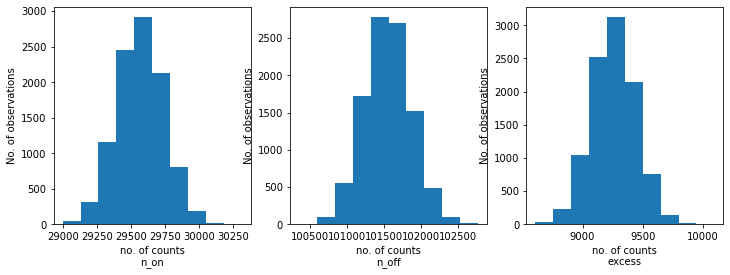

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 40min 4s, sys: 11.1 s, total: 40min 15s
Wall time: 41min 34s


In [15]:
results

[{'index': 2.285078513860973,
  'amplitude': 1.0707193841268212e-12,
  'lambda_': 1.7549757404234874},
 {'index': 2.1996324583985576,
  'amplitude': 1.2851232177832685e-12,
  'lambda_': 1.997248139660084},
 {'index': 2.2150850927687675,
  'amplitude': 1.3692600994164495e-12,
  'lambda_': 2.20388042489302},
 {'index': 2.1744685095939555,
  'amplitude': 1.462793993258135e-12,
  'lambda_': 2.2474813108859273},
 {'index': 2.243873278458896,
  'amplitude': 1.2666459861422052e-12,
  'lambda_': 1.9900955664082853},
 {'index': 2.224555841721795,
  'amplitude': 1.2790952762632778e-12,
  'lambda_': 2.0144251668081212},
 {'index': 2.3291540173955845,
  'amplitude': 9.829721114495055e-13,
  'lambda_': 1.6931848673905465},
 {'index': 2.1918609482837472,
  'amplitude': 1.4022834966072621e-12,
  'lambda_': 2.1229102661191366},
 {'index': 2.23233981236747,
  'amplitude': 1.2093207915318237e-12,
  'lambda_': 1.8886782502405552},
 {'index': 2.1711397774344117,
  'amplitude': 1.487073324677619e-12,
  'la

index: 2.2174897664136646 += 0.053753758012822096


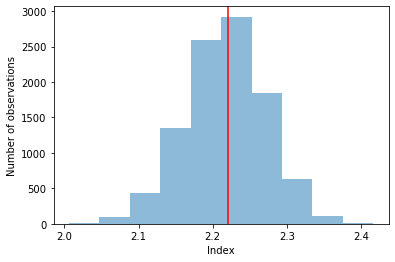

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.3115431851879182e-12 += 1.9345089303413312e-13


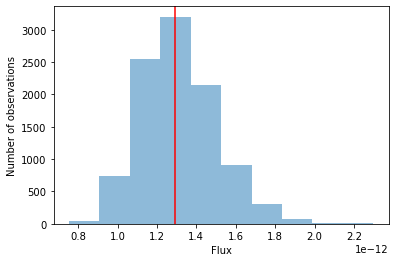

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 2.0122220608909487 += 0.212784120794242


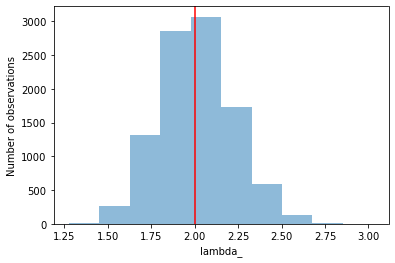

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")